# SVD weight directions are highly interpretable


**TLDR**

If we take the SVD of the weight matrices of the OV circuit and of MLP layers, and project them to token embedding space, we notice that they form highly semantically interpretable clusters. This means that the network learns to make sure that the larger 'actions' of each MLP weight matrix or attention head tend to write to semantically identifiable clusters of the residual stream.

We can use this to both improve our understanding of transformer language models and edit their representations. We use this finding to design both a natural language query locator, where you can write a set of natural language concepts and find all weight directions in the network which correspond to it, and also to edit the network's representations by deleting specific singular vectors, which results in relatively large effects on the logits related to the semantics of that vector and relatively small effects on semantically different clusters


# Introduction

Trying to understand the internal representations of language models, and of deep neural networks in general, has been the primary focus of the field of mechanistic interpretability, with clear applications to AI alignment. If we can understand the internal dimensions along which language models store and manipulate representations, then we can get a much better grasp on their behaviour and ultimately may be able to both make provable statements about bounds on their behaviour, as well as make precise edits to the network to prevent or enhance desired behaviours.

Interpretability, however, is quite a field where we still do not yet fully understand what the basic units of the networks' representations are. While analyzing and investigating individual neurons has lead to some impressive results, especially in [convolutional vision models](https://distill.pub/2020/circuits/), a key issue has always been the polysemanticity of neurons. A single neuron might not just represent a single 'feature' but some linear combination of features in superposition. This effect has been studied in [toy models](https://transformer-circuits.pub/2022/toy_model/index.html) where it is argued that neural networks resort to superpsition when required to represent many more features than they have neurons, and that superposition has a regular and understandable geometry.

A natural hypothesis following from the apparent ubiquity of superposition in neural networks, as well as the autoassociative memory literature, is to store features *as directions* and not in individual neurons. To minimize interference ideally these directions would be pseudo-orthogonal. Technically the features as neurons hypothesis is trivially an orthogonal direction where each feature is encoded by a specific neuron, but the storage capacity of this representational scheme  scales only linearly. In theory, we can do much better if we instead distribute features across multiple neurons and accept some noise. Specifically, the [Johnson-Lindenstrauss lemma](https://en.wikipedia.org/wiki/Johnson–Lindenstrauss_lemma) suggests that we can store *exponentially* many features in pseudorthogonal subspaces. While neural networks probably cannot utilize all of this exponential space, they almost certainly scale superlinearly, necessitating polysemanticity across 'neurons'.

If this hypothesis is true, at least approximately, a key question becomes how we can figure out the directions in which specific features are encoded. While certainly not the entire story, we hypothesize that at least a number of the primary directions used by the network can be inferred from the SVD decomposition of its weight matrices. This makes sense since the network's weights are ultimately linear maps that act upon its representations, and the largest singular vectors of the weight matrix are precisely the directions in which the weight matrix has the largest action. In this post, we show that these SVD directions are often highly and robustly interpretable in medium-sized transformer language models, a property we expect to apply more generally to any transformer or residual architecture.

Specifically, we demonstrate that the SVD directions of both the MLP input and output weights as well as the OV circuit in the transformer, when projected to token space, yield highly interpretable clusters for most of the singular directions. Secondly, we show that this can be applied to automatically detect weight matrices and directions in weight space that match closely with a given set of tokens, and can be used to directly edit model weights to remove or enhance specific singular directions, with strong differential effects on the output logits corresponding to those semantic directions.

Additionally, we experiment with automatic labelling of the SVD directions and find that by using GPT3 as a labeller, we can get reasonable interpretations of directions which allows us to perform comprehensive sweeps of all singular directions in the MLPs over the GPT2 model class, thus providing a proof of concept of scalable automatic labelling on a real task.


# Transformer Architecture


*This is a rather quick and idiosyncratic overview of the elements of transformer networks relevant to this post. For a great general tutorial on how transformers work please see [this post](https://jalammar.github.io/illustrated-transformer/). Here we only discuss autoregressive sequence to sequence models typified by the GPT models. We run our experiments primarily on the gpt2 series of models released by OpenAI.*

Transformers learn from token sequences to token sequences. They are trained with an autoregressive objective so that they predict the next element of the sequence from the sequence prefix.

Each token $t_i$ in the sequence is encoded in a one-hot vector of length $d_e \approx 50000$. These onehot token sequences are projected into the internal embedding space of dimension $\mathcal{R}^{d_x}$ of the model through an embedding matrix $E \in \mathcal{R}^{{d_x} \times {d_e}}$ so that we have $x_0(i) \in \mathcal{R}^{{d_x}} = E t_i$.

The core of the transformer model is the residual stream so that tokens can pass through theoretically modified all the way to the end of the network. At the end, at block $L$, the embedding representation is decoded using the transpose of the embedding matrix $\hat{t}_i = x_L(i) E^T$. This means that the embedding matrix must be approximately orthogonal.

At each block information is added to the residual stream through the application of attention and MLP blocks. A single 'block' consists of both an attention and an MLP layer. These blocks read in the residual stream representation, perform some computation on it, and write out an output back into the residual stream. Mathematically, this results in,


* **$\hat{x}_l  = x_{l-1} + attn(ln(x_{l-1}))$**

* **$x_l = \hat{x}_l + mlp(ln(\hat{x}_l))$**


Where $attn(x) = W_O V \sigma(QK^T)$ with query, key and value matrices defined as usual $V = W_V x$,$Q = W_Qx$, $K= W_K x$. $ln(x)$ is the layer-norm operation. $\sigma(x)$ is the softmax function.

We use insight of the [Elhage et al 2022](https://transformer-circuits.pub/2021/framework/index.html) which is that we can interpret the query and key matrices and value and output matrices not as individual matrices but as single bilinear matrices $QK$ and $OV$ since they only implement linear maps. We call these the $QK$ and $OV$ circuits following their terminology. We are especially interested in the $OV$ circuit $OV \in \mathcal{R}^{{d_e}, {d_e}}$ which we will find to be highly interpretable. The $OV$ matrix writes linearly into the residual stream and does not mix information between tokens while the $QK$ attention circuit mixes information between tokens and is gated by the softmax nonlinearity.

The MLP layers in the transformer are simple 2 layer MLPs $mlp(x) = W_{\text{out}} f(W_{\text{in}}x)$ where $f$ is a standard activation function such as gelu. The $W_{\text{out}}$ matrix writes directly and linearly into the residual stream. The $W_{\text{in}}$ matrix reads linearly from the residual stream if you ignore the layernorm operation. The hidden layer of the MLP typically expands the dimensionality of the residual stream by a factor (which is usually 4) $d_h = 4 \times d_e$ such that  $W_{\text{in}} \in \mathcal{R}^{{d_h} \times {d_e}}$ and $W_{\text{out}} \in \mathcal{R}^{{d_e} \times {d_h}}$.

A transformer model consists of a large number of blocks stacked up sequentially. For instance, gpt2-medium (an approximately 300M parameter model) consists of 24 blocks.

A key insight first written about by Nostalgebraist in the [logit lens](https://www.lesswrong.com/posts/AcKRB8wDpdaN6v6ru/interpreting-gpt-the-logit-lens) is that the dimensionality of the representation is maintained exactly throughout the residual stream, and because of this we can *apply the  de-embedding matrix* $E^T$ to the residual stream *at any point during processing* to get a sense of what the model would output if forced to stop processing at that point. This gives a sense of the way in which information is processed by the model. For instance, you can find out the block at which the model first recognizes the 'correct' answer to a question by projecting the activations of the residual stream at each block to token space and tracking the log-probability of the correct answer token.

A related insight recently proposed in [this paper](https://arxiv.org/pdf/2209.02535) is that many of the weight matrices are of the same dimensionality as the residual stream and hence can also be projected to token space by applying the embedding matrix. For instance, the dimensionality of $W_{\text{out}}$ of the embedding is of dimension $\mathcal{R}^{{d_e} \times {d_h}}$. This means that each of the $d_h$ columns of $W_{\text{out}}$ is of dimension $\mathcal{R}^{d_e}$ which is the same dimension as the embedding and so we can multiply it by the de-embedding matrix $E^T$ to obtain its projection into token space. Intuitively, what this means is that for each neuron in the MLP hidden layer, we can understand how its output weight matrix tends to write back into the residual stream in terms of the tokens it primarily interacts with. They show that in some cases you can get semantic and interpretable clusters of tokens upweighted for each neuron.

However, if you play with [their code](https://github.com/guyd1995/embedding-space) you can quickly realize that their headline results are quite cherrypicked. Most neurons do not appear to encode semantically relevant dimensions in their weights, but instead appear highly polysemantic. Again, this suggests that *neurons* are not the right units of analysis.

Instead, we think and provide evidence that *directions* are a much better unit of analysis. Specifically, if instead of analyzing specific neurons -- i.e. rows of the weight matrix, we perform the same analysis on the *principal directions of action* of the weight matrix, we obtain extremely interpretable results with high reliability and without cherrypicking. We find approximately (70%) (-/?) of the top 50 singular vectors are highly interpretable for the later blocks of the network.

To find these *principal axes of action* of the matrix, we first perform a singular value decomposition of the weight matrix, and then study the singular vectors with the top-k highest singular values. Intuitively, this makes sense because the largest singular vectors encode the directions in which the action of the matrix makes the largest change to the norm of its inputs. To understand intuitively how this works, we first need to understand the singular value decomposition (SVD).







# The Singular Value Decomposition SVD

The SVD is a well known matrix decomposition which factors a matrix into three components -- matrices of left and right singular vectors, which are orthogonal, and a diagonal matrix of singular values. It can be thought of as the generalization of the eigenvalue decomposition to non-square matrices.

Mathematically, the SVD can be represented as,

$M = U S V$

Where $M$ is a $H \times W$ rectangular matrix and $U$ is a $H \times H$ orthogonal matrix, $V$ is a $W \times W$ orthogonal matrix and $S$ is a $H \times W$ diagonal matrix. We each each row of $U$ the right singular vectors and each column of $V$ the left singular vectors.

Intuitively, we can imagine the SVD as rotating the original basis to a new orthogonal basis, where the i'th singular vector quantifies the direction which has the i'th largest effect on the Frobenius norm of a random vector -- i.e. the directions which the matrix expands the most. Another way to think of the SVD is that any linear transformation (encoded in a matrix) can be thought of as comprising a rotation, a rescaling, and a second rotation 'back' into the original basis. $U$ and $V$ can be interpreted as orthogonal rotation matrices corresponding to these rotations and the singular values $S$ can be interpreted as parametrizing this scaling. A final, helpful, intuition about the SVD is as the optimal linear compressor of a matrix with each singular vector corresponding to the 'components' of the matrix and the singular value to the importance of the component. It thus allows us to construct the optimal (linear) low rank approximation of a matrix by ablating the lowest singular values first.

For further intuition on how SVD works we recommend [this post](https://gregorygundersen.com/blog/2018/12/10/svd/).

# Our SVD projection method

Our method is extremely simple. Take a weight matrix $M$ of the network. Take the SVD of this matrix to obtain left and right singular vectors $M = USV$. Take whichever matrix has the same dimensionality as the residual stream (typically the right singular matrix $V$). Take the i'th component of $V$ which corresponds to the i'th singular vector $V[i,:]$ Use the de-embedding matrix $E^T$ to project the i'th singular vector to token space $\hat{t}_i = V[i,:] E^T$. Take the top-k tokens and see that they often correspond to highly semantically interpretable clusters, which imply that this singular vector primarily acts on a semantic subspace.

# Initial Setup Code

Here we just initialize our model and setup a lot of utility functions which will be used later on. We work primarily with gpt2-medium but can straightforwardly apply our analysis to other models. In our quantitative automated labelling we perform a systematic sweep over other GPT2 models.

GPT2-medium is an autoregressive decoder only transformer. It has 24 blocks consisting of an attention and MLP layer. The attention layers have 16 heads. It has a residual dimension of 1024 dimensions and a typical sequence length also of 1024 tokens. The MLP hidden width is $4 \times 1024 = 4096$.

In [1]:
# !curl -fsSL https://deb.nodesource.com/setup_16.x | sudo -E bash -; sudo apt-get install -y nodejs

In [2]:
import torch
from collections import Counter
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import gc
from copy import deepcopy
from tqdm.auto import tqdm, trange
import re
from collections import defaultdict
from transformers import AutoModelForCausalLM, AutoTokenizer
# utils
import json
from torch import nn
import torch.nn.functional as F
from datasets import load_dataset
from copy import deepcopy
from torch.nn import functional as F
from tabulate import tabulate
from tqdm import tqdm, trange
import functools
import math

# this resets up the site so you don't have to restart the runtime to use pysvelte
import site
site.main()


sns.set_palette('colorblind')
cmap = sns.color_palette('colorblind')

In [6]:
# import pysvelte

# token utilities

In [3]:
def keep_k(x, k=100, absolute=True, dim=-1):
    shape = x.shape
    x_ = x
    if absolute:
        x_ = abs(x)
    values, indices = torch.topk(x_, k=k, dim=dim)
    res = torch.zeros_like(x)
    res.scatter_(dim, indices, x.gather(dim, indices))
    return res

def get_max_token_length(tokens):
  maxlen = 0
  for t in tokens:
    l = len(t)
    if l > maxlen:
      maxlen = l
  return maxlen

def pad_with_space(t, maxlen):
  spaces_to_add = maxlen - len(t)
  for i in range(spaces_to_add):
    t += " "
  return t

def convert_to_tokens(indices, tokenizer, extended, extra_values_pos, strip=True, pad_to_maxlen=False):
    if extended:
        res = [tokenizer.convert_ids_to_tokens([idx])[0] if idx < len(tokenizer) else
               (f"[pos{idx-len(tokenizer)}]" if idx < extra_values_pos else f"[val{idx-extra_values_pos}]")
               for idx in indices]
    else:
        res = tokenizer.convert_ids_to_tokens(indices)
    if strip:
        res = list(map(lambda x: x[1:] if x[0] == 'Ġ' else "#" + x, res))
    if pad_to_maxlen:
      maxlen = get_max_token_length(res)
      res = list(map(lambda t: pad_with_space(t, maxlen), res))
    return res


def top_tokens(v_tok, k=100, tokenizer=None, only_english=False, only_ascii=True, with_values=False,
               exclude_brackets=False, extended=True, extra_values=None, pad_to_maxlen=False):
    if tokenizer is None:
        tokenizer = my_tokenizer
    v_tok = deepcopy(v_tok)
    ignored_indices = []
    if only_ascii:
        ignored_indices = [key for val, key in tokenizer.vocab.items() if not val.strip('Ġ').isascii()]
    if only_english:
        ignored_indices =[key for val, key in tokenizer.vocab.items() if not (val.strip('Ġ').isascii() and val.strip('Ġ[]').isalnum())]
    if exclude_brackets:
        ignored_indices = set(ignored_indices).intersection(
            {key for val, key in tokenizer.vocab.items() if not (val.isascii() and val.isalnum())})
        ignored_indices = list(ignored_indices)
    v_tok[ignored_indices] = -np.inf
    extra_values_pos = len(v_tok)
    if extra_values is not None:
        v_tok = torch.cat([v_tok, extra_values])
    values, indices = torch.topk(v_tok, k=k)
    res = convert_to_tokens(indices, tokenizer, extended=extended, extra_values_pos=extra_values_pos,pad_to_maxlen = pad_to_maxlen)
    if with_values:
        res = list(zip(res, values.cpu().numpy()))
    return res


def top_matrix_tokens(mat, k=100, tokenizer=None, rel_thresh=None, thresh=None,
                      sample_entries=10000, alphabetical=True, only_english=False,
                      exclude_brackets=False, with_values=True, extended=True):
    if tokenizer is None:
        tokenizer = my_tokenizer
    mat = deepcopy(mat)
    ignored_indices = []
    if only_english:
        ignored_indices = [key for val, key in tokenizer.vocab.items() if not (val.isascii() and val.strip('[]').isalnum())]
    if exclude_brackets:
        ignored_indices = set(ignored_indices).intersection(
            {key for val, key in tokenizer.vocab.items() if not (val.isascii() and val.isalnum())})
        ignored_indices = list(ignored_indices)
    mat[ignored_indices, :] = -np.inf
    mat[:, ignored_indices] = -np.inf
    cond = torch.ones_like(mat).bool()
    if rel_thresh:
        cond &= (mat > torch.max(mat) * rel_thresh)
    if thresh:
        cond &= (mat > thresh)
    entries = torch.nonzero(cond)
    if sample_entries:
        entries = entries[np.random.randint(len(torch.nonzero(cond)), size=sample_entries)]
    res_indices = sorted(entries,
                         key=lambda x: x[0] if alphabetical else -mat[x[0], x[1]])
    res = [*map(partial(convert_to_tokens, extended=extended, tokenizer=tokenizer), res_indices)]

    if with_values:
        res_ = []
        for (x1, x2), (i1, i2) in zip(res, res_indices):
            res_.append((x1, x2, mat[i1][i2].item()))
        res = res_
    return res

# Main functions

In [4]:

def rgetattr(obj, attr, *args):
    def _getattr(obj, attr):
        return getattr(obj, attr, *args)
    return functools.reduce(_getattr, [obj] + attr.split('.'))

def rsetattr(obj, attr, val):
    pre, _, post = attr.rpartition('.')
    return setattr(rgetattr(obj, pre) if pre else obj, post, val)

def get_model_tokenizer_embedding(model_name="gpt2-medium"):
  device = 'cuda' if torch.cuda.is_available() else 'cpu'
  if device == 'cpu':
    print("WARNING: you should probably restart on a GPU runtime")

  model = AutoModelForCausalLM.from_pretrained(model_name).to(device)
  tokenizer = AutoTokenizer.from_pretrained(model_name)
  emb = model.get_output_embeddings().weight.data.T.detach()
  return model, tokenizer, emb, device


def get_model_info(model):
  num_layers = model.config.n_layer
  num_heads = model.config.n_head
  hidden_dim = model.config.n_embd
  head_size = hidden_dim // num_heads
  return num_layers, num_heads, hidden_dim, head_size

def get_mlp_weights(model,num_layers, hidden_dim):
  Ks = []
  Vs = []
  for j in range(num_layers):
    K = model.get_parameter(f"transformer.h.{j}.mlp.c_fc.weight").T.detach()
    # fuse the layernorm
    ln_2_weight = model.get_parameter(f"transformer.h.{j}.ln_2.weight").detach()
    K = torch.einsum("oi,i -> oi", K, ln_2_weight)

    V = model.get_parameter(f"transformer.h.{j}.mlp.c_proj.weight")
    Ks.append(K)
    Vs.append(V)

  Ks =  torch.cat(Ks)
  Vs = torch.cat(Vs)
  K_heads = Ks.reshape(num_layers, -1, hidden_dim)
  V_heads = Vs.reshape(num_layers, -1, hidden_dim)
  return K_heads, V_heads

def get_attention_heads(model, num_layers, hidden_dim, num_heads, head_size):
  qkvs = []
  for j in range(num_layers):
    qkv = model.get_parameter(f"transformer.h.{j}.attn.c_attn.weight").detach().T
    ln_weight_1 = model.get_parameter(f"transformer.h.{j}.ln_1.weight").detach()

    qkv = qkv - torch.mean(qkv, dim=0)
    qkv = torch.einsum("oi,i -> oi", qkv, ln_weight_1)
    qkvs.append(qkv.T)

  W_Q, W_K, W_V = torch.cat(qkvs).chunk(3, dim=-1)
  W_O = torch.cat([model.get_parameter(f"transformer.h.{j}.attn.c_proj.weight") for j in range(num_layers)]).detach()
  W_V_heads = W_V.reshape(num_layers, hidden_dim, num_heads, head_size).permute(0, 2, 1, 3)
  W_O_heads = W_O.reshape(num_layers, num_heads, head_size, hidden_dim)
  W_Q_heads = W_Q.reshape(num_layers, hidden_dim, num_heads, head_size).permute(0, 2, 1, 3)
  W_K_heads = W_K.reshape(num_layers, hidden_dim, num_heads, head_size).permute(0, 2, 1, 3)
  return W_Q_heads, W_K_heads, W_V_heads, W_O_heads

def top_singular_vectors(mat, emb, all_tokens, k = 20, N_singular_vectors = 10, with_negative = False,use_visualization=True, filter="topk"):
  U,S,V = torch.linalg.svd(mat)
  Vs = []
  for i in range(N_singular_vectors):
      acts = V[i,:].float() @ emb
      Vs.append(acts)
  if use_visualization:
    Vs = torch.stack(Vs, dim=1).unsqueeze(1) # n_tokens, n_layers (1), n_directions
    pysvelte.TopKTable(tokens=all_tokens, activations=Vs, obj_type="SVD direction", k=k, filter=filter).show()
  else:
    Vs = [top_tokens(Vs[i].float().cpu(), k = k, pad_to_maxlen=True) for i in range(len(Vs))]
    print(tabulate([*zip(*Vs)]))
  if with_negative:
    Vs = []
    for i in range(N_singular_vectors):
      acts = -V[i,:].float() @ emb
      Vs.append(acts)
    if use_visualization:
      Vs = torch.stack(Vs, dim=1).unsqueeze(1) # n_tokens, n_layers (1), n_directions
      pysvelte.TopKTable(tokens=all_tokens, activations=Vs, obj_type="SVD direction", k=k, filter=filter).show()
    else:
      Vs = [top_tokens(Vs[i].float().cpu(), k = k, pad_to_maxlen=True) for i in range(len(Vs))]
      print(tabulate([*zip(*Vs)]))

def plot_MLP_singular_vectors(K,layer_idx, max_rank=None):
  W_matrix = K[layer_idx, :,:]
  U,S,V = torch.linalg.svd(W_matrix,full_matrices=False)
  if not max_rank:
    max_rank = len(S)
  if max_rank > len(S):
    max_rank = len(S) -1
  plt.plot(S[0:max_rank].detach().cpu().numpy())
  plt.yscale('log')
  plt.ylabel("Singular value")
  plt.xlabel("Rank")
  plt.title("Distribution of the singular vectors")
  plt.show()

def cosine_sim(x,y):
    return torch.dot(x,y) / (torch.norm(x) * torch.norm(y))


def normalize_and_entropy(V, eps=1e-6):
    absV = torch.abs(V)
    normV = absV / torch.sum(absV)
    entropy = torch.sum(normV * torch.log(normV + eps)).item()
    return -entropy


In [5]:
def get_attention_heads(model, num_layers, hidden_dim, num_heads, head_size):
  qkvs = []
  for j in range(num_layers):
    qkv = model.get_parameter(f"transformer.h.{j}.attn.c_attn.weight").detach().T
    ln_weight_1 = model.get_parameter(f"transformer.h.{j}.ln_1.weight").detach()

    qkv = qkv - torch.mean(qkv, dim=0)
    qkv = torch.einsum("oi,i -> oi", qkv, ln_weight_1)
    qkvs.append(qkv.T)

  W_Q, W_K, W_V = torch.cat(qkvs).chunk(3, dim=-1)
  W_O = torch.cat([model.get_parameter(f"transformer.h.{j}.attn.c_proj.weight") for j in range(num_layers)]).detach()
  W_V_heads = W_V.reshape(num_layers, hidden_dim, num_heads, head_size).permute(0, 2, 1, 3)
  W_O_heads = W_O.reshape(num_layers, num_heads, head_size, hidden_dim)
  W_Q_heads = W_Q.reshape(num_layers, hidden_dim, num_heads, head_size).permute(0, 2, 1, 3)
  W_K_heads = W_K.reshape(num_layers, hidden_dim, num_heads, head_size).permute(0, 2, 1, 3)
  return W_Q_heads, W_K_heads, W_V_heads, W_O_heads

# Visualizing the SVD directions

With the basic code and utility functions setup, we can start visualizing the top singular vectors of the various weight matrices in our transformer model. We find that the singular vectors of both the OV circuit and the MLP layers (especially the MLP $W_{\text{in}}$) matrices appear to give mostly highly interpretable clusters when projected to latent space.

In [7]:
# Load up the model and get all the key weight matrices.
model, tokenizer, emb, device = get_model_tokenizer_embedding()
my_tokenizer = tokenizer
num_layers, num_heads, hidden_dim, head_size = get_model_info(model)
all_tokens = [tokenizer.decode([i]) for i in range(tokenizer.vocab_size)]

K,V = get_mlp_weights(model, num_layers = num_layers, hidden_dim = hidden_dim)
W_Q_heads, W_K_heads, W_V_heads, W_O_heads = get_attention_heads(model, num_layers=num_layers, hidden_dim=hidden_dim, num_heads=num_heads, head_size = head_size)


In [8]:
W_Q_heads.shape

torch.Size([24, 16, 1024, 64])

In [15]:
W_K_heads.shape

torch.Size([24, 16, 1024, 64])

In [16]:
K.shape

torch.Size([24, 4096, 1024])

Let's check out some OV circuits. For instance in block 22, head 10, we find these clusters. The way to read these tables is that the columns each represent a singular vector, ordered from that of the highest singular vector down to the lowest. The rows are the top-k token activations when the singular vector dimension is projected to token space, ordered by their value from top (greatest) to bottom (lowest). The colors represent the strength of the embedding.

Feel free to check out other layers and heads to get a real feel for what the full distribution looks like.

In [10]:
def OV_top_singular_vectors(W_V_heads, W_O_heads, emb, layer_idx, head_idx, all_tokens, k=20, N_singular_vectors=10, use_visualization=False, with_negative=False, filter="topk", return_OV=False):
  W_V_tmp, W_O_tmp = W_V_heads[layer_idx, head_idx, :], W_O_heads[layer_idx, head_idx]
  OV = W_V_tmp @ W_O_tmp
  U,S,V = torch.linalg.svd(OV)
  Vs = []
  for i in range(N_singular_vectors):
      acts = V[i,:].float() @ emb
      Vs.append(acts)
  if use_visualization:
    Vs = torch.stack(Vs, dim=1).unsqueeze(1) # n_tokens, n_layers (1), n_directions
    pysvelte.TopKTable(tokens=all_tokens, activations=Vs, obj_type="SVD direction", k=k, filter=filter).show()
  else:
    Vs = [top_tokens(Vs[i].float().cpu(), k = k, pad_to_maxlen=True) for i in range(len(Vs))]
    print(tabulate([*zip(*Vs)]))
  if with_negative:
    Vs = []
    for i in range(N_singular_vectors):
      acts = -V[i,:].float() @ emb
      Vs.append(acts)
    if use_visualization:
      Vs = torch.stack(Vs, dim=1).unsqueeze(1) # n_tokens, n_layers (1), n_directions
      pysvelte.TopKTable(tokens=all_tokens, activations=Vs, obj_type="SVD direction", k=k, filter=filter).show()
    else:
      Vs = [top_tokens(Vs[i].float().cpu(), k = k, pad_to_maxlen=True) for i in range(len(Vs))]
      print(tabulate([*zip(*Vs)]))
  if return_OV:
    return OV

OV_top_singular_vectors(W_V_heads, W_O_heads, emb, layer_idx=22,
                        head_idx=10,k=20, N_singular_vectors=15,
                        all_tokens = all_tokens,
                        use_visualization=False)

----------------------  -------------  -----------  ----------  ------------  -------------  ------------  -----------  ------------  ------------  ------------  ---------  ----------  --------  ----------
#inventoryQuantity      hear           news         recording   #Journal      reading        Image         #PDF         Print         memory        word          recol      Text        Scan      #Pages
#rawdownload            listeners      television   recordings  #journal      Reading        image         PDF          #Alert        #mem          Publication   #ghai      texts       scanner   #pages
#oreAnd                 hears          #News        #YouTube    print         read           photography   print        #search       remem         Surve         #tein      listeners   scan      pages
#reportprint            Hear           TV           Recording   newspaper     reads          images        printed      Notification  Mem           #Word         Sample     text        scan

We see extremely clear semantic clusters form for each singular vector. The head as a whole clearly seems semantically related to reading/writing/literate culture and social media. We also see an interesting pattern, which is common, whereby the head as a whole seems to handle a broad concept and each singular vector specializes into a separate semantic aspect of this broader concept. For instance, in this case we see that the second singular vector specializes in writing and written things, the third and fourth in recordings and ways to record, the fifth and sixth in journals, newspapers and reading. The 7th singular vector seems closely related to social media and especially twitter, and so on.

It is very common that the first singular vector does not encode anything meaningful and simply encodes a component in the direction of the most frequent words, as in this example.

Another example is layer 22 head 15

In [ ]:
OV_top_singular_vectors(W_V_heads, W_O_heads, emb, layer_idx=22,
                        head_idx=15,N_singular_vectors=15,k=20,all_tokens = all_tokens,
                        use_visualization=False)

----  --------  -----------  ----------  -----------  -----------  --------------  ---------  -----------  -------------  ----------  --------------  ----------  ----------  ------------
the   Players   #Players     #resp       Fans         #joining     #Organ          Compos     filmmaker    co             Leaders     champion        designer    teammate    volunteers
#-    #Players  Players      #inational  supporters   #Engineers   #organ          #Anderson  Receiver     Particip       #flags      champions       Designer    #Team       volunteer
#,    #Player   Player       #eus        fans         #mates       Teams           #enegger   #director    partners       #feature    symbol          actor       teammates   Volunteers
a     player    #player      Parties     party        supervisors  #team           Anderson   Actor        partner        leader      representative  item        team        #Stew
and   players   #players     Bris        #party       #Manager     organisation

Again we see that the first singular vector encodes just some very common words. We see that this head handles a number of different concepts relating to organizations/groups but that each singular vector primarily encodes a semantically meaningful direction in this space. For instance, the second singular vector encodes playing, the third some combination of musicians, theatre, and filmmakers, the fifth organizations and teams, and so on.

While these are somewhat cherrypicked examples, we encourage the reader to play around with different heads and layer indices. You will quickly see that, unlike neurons, there are not that many heads (only 16) and that most of them seem to have clearly identifiable semantic clusters.

Another example of a similar direction is layer 22 head 8, which appears to encode concepts related to places, countries, cities, localities etc

In [ ]:
OV_top_singular_vectors(W_V_heads, W_O_heads, emb,layer_idx=22, head_idx=8,N_singular_vectors=15,k=20, all_tokens = all_tokens)

----  ------------  -----------  -----------  -----------  ------------  -------------  -----------  -------------  -----------  -------------  ----------  ------------  -----------  --------
the   #England      Europe       Indones      #adelphia    #City         #community     country      Globe          #Local       #Washington    #indust     Coastal       Square       #CHQ
#,    England       Africa       Indonesian   Athens       city          Maryland       #language    worlds         local        Washington     Industry    Regional      #UK          #NSA
#-    #Wisconsin    #Europe      Chilean      City         Yorkshire     statewide      Country      Ottawa         region       #Philadelphia  industry    regional      market       Brussels
and   Wales         Italy        Colombian    #City        CITY          #Community     language     Copenhagen     Local        Chicago        #ystem      inland        UK           #Syria
a     Slovakia      Asia         #company     Citi

An especially interesting head is layer 22 head 3, which doesn't appear to have a unified global semantic concept, but nevertheless many of its singular dimensions have apparently highly unrelated but clearly distinct semantic concepts, specifically frost/cold, water/rain, ice/meant/hunting/, killings/undead, dogs/animals, and so on. The singular direction 0 this time encodes the *least* frequent tokens. This occurs because of an ambiguity in the definition of the SVD where it does not matter whether a specific singular vector is positive or negative. We will discuss how the mdoel uses this ambiguity to fit more representations in the 'negative dimensions' later on.

In [ ]:
OV_top_singular_vectors(W_V_heads, W_O_heads, emb,layer_idx=22, head_idx=3,N_singular_vectors=15,k=20, all_tokens = all_tokens)

----------------------  --------  --------  ----------  --------  ---------  ------------  ------------  -------  -------------  --------  -------  ---------  ---------  -------
Skydragon               frost     air       #Rain       Ice       ROCK       Pupp          #Sex          bite     lighting       sleep     Luthor   #sleep     veins      Ghost
#GoldMagikarp           Snow      blows     flood       #Meat     Rock       Dog           masturb       bites    Orn            Sleeping  Sex      #Water     #Iron      #spir
externalTo              ice       airflow   Wet         ice       #Rock      dog           masturbation  sleep    Lights         Sleep     Cyborg   sleep      #Heat      #Ghost
TheNitrome              cold      blow      floods      #Ice      rocks      kitten        sex           bitten   #Light         #Cry      Fat      #water     Extrem     spirits
#rawdownload            chilled   blowing   Rain        Smoke     Rocks      puppy         Sex           chew     l

We don't want to give the impression that all heads in the OV circuit necessarily encode nice and meaningful semantic relations. Some of them don't appear to. For instance head 2 results in:

In [ ]:
OV_top_singular_vectors(W_V_heads, W_O_heads, emb,layer_idx=22, head_idx=2,N_singular_vectors=15,k=20, all_tokens = all_tokens)

------------------  ----  ----  ----  ---------------  -------  ----------  --------  ---------  ------  ----------  --------  -----------  ----------  ------------
misunder            the   the   #-    PsyNet           #-.      #esides     cig       reverted   "       self        Bombs     #arya        Drawn       #asus
predec              #,    a     (     #gement          #-+      #")         ".        sovere     "'      #TextColor  Alley     #greg        #gamer      #oppable
helicop             #-    #,    #.    ())              #)-      #stood      metab     Berm       "[      {:          reinvest  #++++++++    Obj         Brav
comr                (     "     #in   #ohydrate        #-,      #istani     destro    depletion  "(      #Published  #elin     #summary     Finder      Apprentice
neighb              and   and   #a    #xual            #-       #tested     "         grate      "#      '           #NN       #tainment    #MAT        #mentation
landsl              a     in    #

Some of these singular vectors clearly relate to specific punctuation patterns (this is actually a somewhat common phenomenon, especially in earlier layers) but other singular vectors appear quite uninterpretable.

We will perform a quantitative study of the fraction of interpretable layers and SVD directions later on in the post.

Finally, to show that the degree of semantic coherence we observe in the trained matrices is incredibly unlikely to occur by chance, we apply our technique to random gaussian matrices which results in entirely no semantic structure emerging at all.

In [ ]:
def random_top_singular_vectors(emb,all_tokens,k=20, N=10, use_visualization = False):
  A = torch.randn(size=(1024,1024)).to(device)
  U,S,V = torch.linalg.svd(A)
  Vs = []
  for i in range(N):
      acts = V[i,:].float() @ emb
      Vs.append(acts)
  if use_visualization:
    Vs = torch.stack(Vs, dim=1).unsqueeze(1) # n_tokens, n_layers (1), n_directions
    pysvelte.TopKTable(tokens=all_tokens, activations=Vs, obj_type="SVD direction", k=k, filter="topk").show()
  else:
    Vs = [top_tokens(Vs[i].float().cpu(), k = k, pad_to_maxlen=True) for i in range(len(Vs))]
    print(tabulate([*zip(*Vs)]))

random_top_singular_vectors(emb, N=20, k=20, all_tokens = all_tokens)

------------  ----------  -----------------  ----------  ----------  --------  ---------  -----------  ----------  --------  ---------  -----------  ---------  -------------  ----------  ----------  ----------  ---------  -------  ---------
#inav         #flag       #MQ                Hatt        #sky        #panic    #{"        #*)          #iscal      #rod      #uckland   #icion       #ocate     #stein         #nir        #AME        #tha        Sunrise    #ovi     #Pi
#cffff        #uka        externalToEVAOnly  Jeep        witchcraft  #pots     #alan      #plets       #arching    #ppo      Carlson    #imei        #Mine      #76561         dissatisf   #oris       Procedure   #zes       Hobby    #uckles
#CAP          #irtual     Hels               guid        #idal       #creen    Zed        #Pages       #Mot        #flix     Sapp       #iage        #Buzz      NEC            Gujar       #IVERS      #nian       Everyday   #eele    #politics
#nob          #eka        HT                

# Expanding k and N

Currently we have just plotted the first 15 singular vectors and the top-20 tokens. However, the semantic patterns often extend much further and deeper than that. For instance, if we take our original head, we can see that even down to the top-100 tokens are often highly interpretable and still within the clear semantic cluster, demonstrating the robustness of the effect. Moreover, and more interestingly, there are often highly interpretable singular vectors down to the 50th or so singular vectors. This means that the network is really heavily filling up the 'direction space' available to it (each head only has a hidden dimension of 64 and hence a maximum of 64 singular values directions it can fill).

In [ ]:
OV_top_singular_vectors(W_V_heads, W_O_heads, emb,layer_idx=22, head_idx=10,N_singular_vectors=64,k=100, all_tokens = all_tokens)

-----  -------------  -------------  -------------  ------------  -------------  --------------  ------------  ------------  ------------  -----------------  -------------  --------------  --------------  -------------  --------------  -------------  ------------  ------------  -------------  --------------  -------------  ----------  -------------  --------------  -----------------  -------------------  ------------------------  -----------  -------------  -------------  -------------  ---------------  ------------  -----------  -------------  ------------  ---------------  ------------  -------------  -----------  --------------  ------------------  -------------  ---------------  --------------  -----------  ---------------  --------------  -------------  --------------  ------------  ---------------  ------------------  -------------  -------------  -------------  ------------  --------------  ------------  -------------  -----------  -----------  -----------
the    hear           

If we plot the distribution of the singular vectors, we can see that the rank only slowly decreases until 64 then rapidly decreases. This is because,fundamentally, the OV matrix is only of rank 64. The singular value distribution of the meaningful ranks, however, declines slowly in log-space, giving at least some evidence towards the idea that the network is utilizing most of the 'space' available in this OV circuit head.

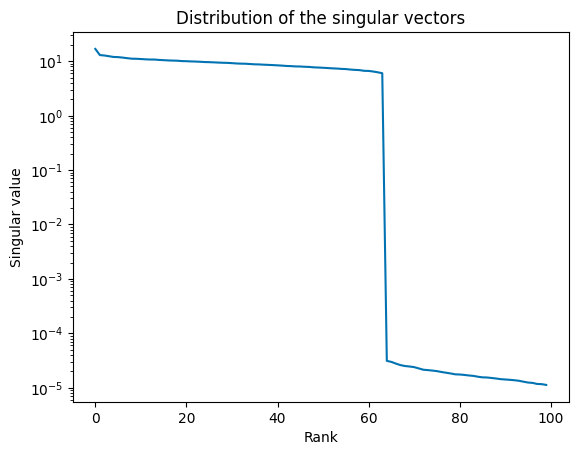

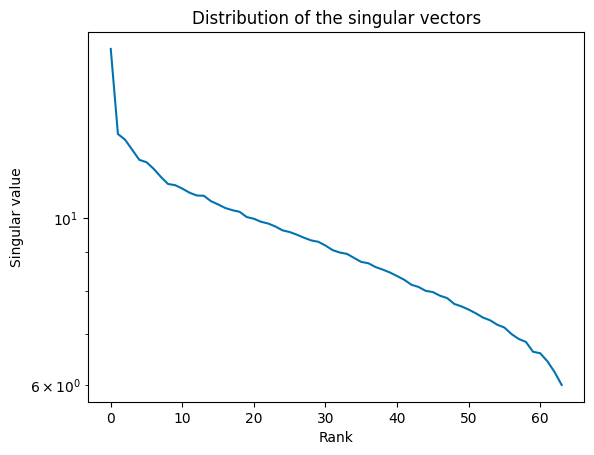

In [ ]:
def plot_singular_value_distribution(W_V_heads, W_O_heads,layer_idx, head_idx, max_rank= 100):
  W_V_tmp, W_O_tmp = W_V_heads[layer_idx, head_idx, :], W_O_heads[layer_idx, head_idx]
  OV = W_V_tmp @ W_O_tmp
  U,S,V = torch.linalg.svd(OV)
  if max_rank > len(S):
    max_rank = len(S) -1
  plt.plot(S[0:max_rank].detach().cpu().numpy())
  plt.yscale('log')
  plt.ylabel("Singular value")
  plt.xlabel("Rank")
  plt.title("Distribution of the singular vectors")
  plt.show()

plot_singular_value_distribution(W_V_heads, W_O_heads,layer_idx = 22, head_idx = 10)
plot_singular_value_distribution(W_V_heads, W_O_heads,layer_idx = 22, head_idx = 10,max_rank = 64)

# Negative Singular Vectors

An interesting finding is that the network can encode separate information in both the positive and negative singular value directions. While each singular value is orthogonal, and hence do not interfere with each other, enabling easy and lossless superposition, the positive and negative directions are highly anticorrelated, potentially causing significant amount of interference if it encodes two highly correlated concepts there.

The singular value decomposition itself is ambiguous between positive and negative singular values -- i.e. that we can represent a given vector as both $+v, +u$ or $-v, -u$ and get the same matrix since the two negatives cancel. This means that our labelling of positive and negative singular vectors is arbitrary, but the existence of both is not, and they can be used to encode separate information. We see that typically both the positive and negative singular values encode similar information -- i.e. related to the broad concept, but often again different aspects of it. For instance, we contrast 'hearing' with listening in the second singular vector of this head.

It is almost always the case that the positive and negative first singular vectors is just the list of the most or least frequent tokens encoded in an antipodal superposition.


In [ ]:
OV_top_singular_vectors(W_V_heads, W_O_heads, emb,layer_idx=22, head_idx=10,N_singular_vectors=15,k=20, with_negative=True, all_tokens = all_tokens)

----  -------------  -----------  ----------  ------------  -------------  ------------  ---------  -----------  ----------  ------------  ---------  ------------  -----------  ----------
the   hear           record       recording   #Journal      reading        Image         Twe        narr         #Chart      word          recol      prints        #videos      #Pages
#-    listeners      Record       recordings  #journal      Reading        image         twitter    narration    #Twitter    Publication   #ghai      photograph    Videos       #pages
#,    hears          #record      #YouTube    print         read           photography   tweets     words        tweeting    Surve         #tein      photo         videos       pages
and   Hear           #Record      Recording   newspaper     reads          images        hasht      #words       Tweet       #Word         Sample     portraits     VIDEOS       #Vis
a     #Interstitial  Records      recorded    Newspaper     #reading       phot

An especially interesting phenomenon sometimes occurs where the negative and positive singular vectors encode an *antipodal pair* where the positive and negative are in some sense semantic opposites. This is clearly seen in head 3 where we have an antipodal encoding of *fire* and *ice*. We believe that this makes sense given that these semantic concepts are probably somewhat naturally anticorrelated resulting in little interference from putting them in superposition.

We hypothesize that, given this OV circuit writes linearly and directly to the residual stream, the existence of these antipodal directions in the weight matrix might imply the existence of such antipodal pairs in the residual stream activations. We have not yet tested this hypothesis.

In [ ]:
OV_top_singular_vectors(W_V_heads, W_O_heads, emb,layer_idx=22, head_idx=3,N_singular_vectors=15,k=20, with_negative=True, all_tokens = all_tokens)

----------------------  --------  --------  ----------  --------  ---------  ------------  ------------  -------  -------------  --------  -------  ---------  ---------  -------
Skydragon               frost     air       #Rain       Ice       ROCK       Pupp          #Sex          bite     lighting       sleep     Luthor   #sleep     veins      Ghost
#GoldMagikarp           Snow      blows     flood       #Meat     Rock       Dog           masturb       bites    Orn            Sleeping  Sex      #Water     #Iron      #spir
externalTo              ice       airflow   Wet         ice       #Rock      dog           masturbation  sleep    Lights         Sleep     Cyborg   sleep      #Heat      #Ghost
TheNitrome              cold      blow      floods      #Ice      rocks      kitten        sex           bitten   #Light         #Cry      Fat      #water     Extrem     spirits
#rawdownload            chilled   blowing   Rain        Smoke     Rocks      puppy         Sex           chew     l

# MLP $W_{\text{in}}$ intrepretability

Beyond the OV circuit, we have also had significant success applying this technique to understanding the *MLP* layers in transformer models. This is important because thus far the MLP layers have largely resisted other analysis techniques. We can apply our projection technique of the SVD vectors to both the input and output MLP weights. This is because the SVD will always produce a matrix (whether of the left or right singular vectors) of the same shape as the embedding and does not require the weight matrices to be square.

We first show that our techniques work on $W_{\text{in}}$ and then on $W_{\text{out}}$.

In [ ]:
def MLP_K_top_singular_vectors(K, emb,layer_idx, all_tokens, k=20, N_singular_vectors=10, with_negative = False, use_visualization = False):
  W_matrix = K[layer_idx, :,:]
  U,S,V = torch.linalg.svd(W_matrix,full_matrices=False)
  Vs = []
  for i in range(N_singular_vectors):
      acts = V[i,:].float() @ emb
      Vs.append(acts)
  if use_visualization:
    Vs = torch.stack(Vs, dim=1).unsqueeze(1) # n_tokens, n_layers (1), n_directions
    pysvelte.TopKTable(tokens=all_tokens, activations=Vs, obj_type="SVD direction", k=k, filter="topk").show()
  else:
    Vs = [top_tokens(Vs[i].float().cpu(), k = k, pad_to_maxlen=True) for i in range(len(Vs))]
    print(tabulate([*zip(*Vs)]))
  if with_negative:
    Vs = []
    for i in range(N_singular_vectors):
      acts = -V[i,:].float() @ emb
      Vs.append(acts)
    if use_visualization:
      Vs = torch.stack(Vs, dim=1).unsqueeze(1) # n_tokens, n_layers (1), n_directions
      pysvelte.TopKTable(tokens=all_tokens, activations=Vs, obj_type="SVD direction", k=k, filter="topk").show()
    else:
      Vs = [top_tokens(Vs[i].float().cpu(), k = k, pad_to_maxlen=True) for i in range(len(Vs))]
      print(tabulate([*zip(*Vs)]))

MLP_K_top_singular_vectors(K, emb,layer_idx = 22, k=20, N_singular_vectors= 50, all_tokens = all_tokens)

--------  -------------  -----------  -----------  --------------  --------------  ----------  --------------  -------------  ------------  ----------  ------------  -----------  -----------  ----------  -------------  ------------  -------------  -------------  ------------  ------------  ------------  ------------  ------------  -------------  --------  ---------------  ---------  -------------  ----------------  ---------------  ----------  ----------  -----------  ---------  ------------  ------------  ----------  --------------  -----------  ----------  ---------  -------------  -------------  -----------  ------------  -------------  -------------  ------------  ------------
challeng  apprehend      decoration   Craigslist   underlying      optimized       athletic    sued            teams          #nil          entertain   Appalach      boutique     meal         cellul      researcher     #community    coastal        audible        mechanic      Unemployment  Techniques    impla

In [20]:
K.shape

torch.Size([24, 4096, 1024])

We again see that most of the singular vectors have a relatively clear semantic concept or cluster that they are referring to. For instance, singular vector 3 appears heavily related to politics, singular vector 4 to do with online businesses, and so forth.

This MLP block appears generally to have a lot of politics related words but also a wide variety of other concepts.

To get a feel for the MLPs, we plot a few more of the input weights. Unlike the attention, there is no concept of heads so there are only 24 MLP blocks in the whole network. Thus, there is no obvious way to cherrypick.

In [ ]:
MLP_K_top_singular_vectors(K, emb,layer_idx=21, k=20, N_singular_vectors= 50, all_tokens = all_tokens)

---------  --------------  ------------  -------------  ----------  -----------  -----------  ----------  --------------  -----------  ----------  ---------------  -------------  -----------  -----------  ----------  -------------  ----------  -------------  -----------  ------------------  ----------  -------------  ------------  ----------  ----------  -----------  -------------  ------------  --------  -----------  ----------  --------------  -------------  ------------  --------------  ----------  ------------  -----------  -------------  ---------  ---------  ------------  ----------  -------------  ----------  -------------  ---------  --------  ---------
challeng   inadvertently   wand          optimized      #export     Negro        reigning     iter        empirical       enqu         unarmed     destabil         fleets         #htaking     Holder       incub       summons        vivo        suggestive     upscale      #ptoms              inactive    Balanced       proceedings

In [ ]:
MLP_K_top_singular_vectors(K, emb,layer_idx=20, k=20, N_singular_vectors= 50, all_tokens = all_tokens)

---------  ------------  -------------  -------------  -----------  -----------  ------------  ---------  --------------  -----------  -------------  -------------  -----------  ------------  ----------  ------------  --------------  -----------  -------------  ----------  --------------------  --------------  ----------  ----------  -----------  -----------  ------------  -----------  ----------  ------------  ---------  --------------  -----------  -------------  -----------  --------------  ----------  -------  -------------  ------------  ----------  ----------------  ------------  ------------  --------------  ---------------  ----------  -------------  ------  ----------
mathemat   national      verbally       #Policy        playbook     anime        DIY           defences   #opolis         Barclays     underpin       ammo           pag          collaborated  vibrant     #eligible     discipline      statistic    related        invested    BELOW                 mile            Ba

In [ ]:
MLP_K_top_singular_vectors(K, emb,layer_idx=19, k=20, N_singular_vectors= 50, all_tokens = all_tokens)

-----  ------------  -----------  -----------  ------------  --------------  -------------  ----------  ------------  -----------  --------  -----------  -----------  -----------  ------------  --------------  -------------  ------------  -----------  ---------  ------------  ------------------  -------------  ----------  ----------  ------------  -------------  -----------  -----------  -----------  ------------  ------------  ----------  ----------  ---------  ------------  ------------  --------  ----------  -----------  ------------  -------  ----------  -------  --------------  -------------  -----------  -------------  ----------  --------------
and    philanthrop   gulf         #Miami       fantasy       cryptographic   #Policy        annihil     announcement  whoever      obsessed  override     frontline    offerings    Literature    decorated       skilled        eligible      enqu         suburbs    purchase      #Ingredients        #ENTION        caster      sequel      Reso

In [ ]:
MLP_K_top_singular_vectors(K, emb,layer_idx=18, k=20, N_singular_vectors= 50, all_tokens = all_tokens)

-----  -----------  -------------  -------------  ------------  ------------  -------------  -----------  --------------  ---------  ---------  ---------  -------------  -----------  -----------  ------------  -------------  -------------  -------------  -----------  ----------------  ----------  -------------  ------------  ----------  -----------  ---------  ---------------  -----------  ------------  ----------  ----------  ---------------  ----------  --------------------  ------------  ------------------------  ----------  --------------  -----------  -----------  --------  -----------  -----------  ------------  --------  ------------  -------------  ------------  ------------
#,     fundraising  #Political     underlying     inhabitants   optimizing    overcome       injured      #phen           evil       defeats    destabil   conclude       ripe         citiz        paradise      panicked       fuel           statewide      confines     symptoms          #flows      #iability 

If you stare at it for a while, you begin to get a sense of how MLPs differ systematically from the OV circuits. MLPs, while each representing a single coherent concept in each singular vector, generally appear much more polysemantic than the OV circuit heads. This is probably because therei s a limited amount of MLPs in the network and hence to function productively, they need to be able to represent and act on a large number of concepts simultaneously.

The MLPs also have much 'deeper' representations in their singular values. That is, the singular vectors are still interpretable to a much greater depth than are the attention OV circuits. This is probably because the MLP weight matrices are nearly full rank unlike the OV matrix which is low rank. This gives the network much more space to represent a wide variety of semantic concepts and the network appears to use most (but not all) of this space.

This can be seen by plotting the singular value distribution of the weight matrices which all follow a highly distinctive distribution.

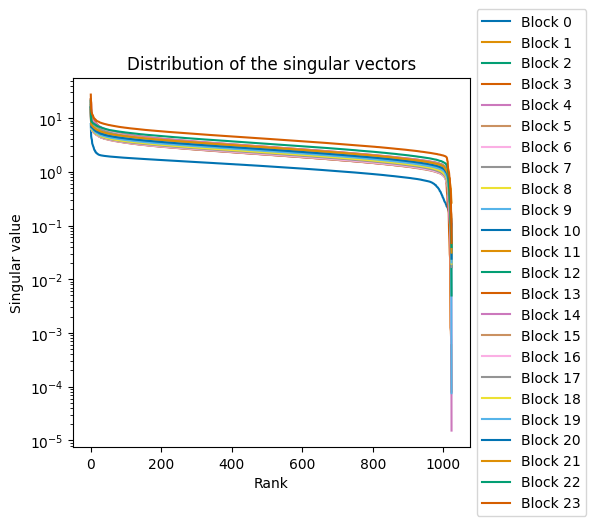

In [ ]:
def plot_all_MLP_singular_vectors(K,max_rank=None):
  fig = plt.figure()
  ax = plt.subplot(111)
  for i in range(num_layers):
    W_matrix = K[i, :,:]
    U,S,V = torch.linalg.svd(W_matrix,full_matrices=False)
    if not max_rank:
      max_rank = len(S)
    if max_rank > len(S):
      max_rank = len(S) -1
    plt.plot(S[0:max_rank].detach().cpu().numpy(), label="Block " + str(i))
  plt.yscale('log')
  plt.ylabel("Singular value")
  plt.xlabel("Rank")
  plt.title("Distribution of the singular vectors")
  box = ax.get_position()
  ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
  ax.legend(loc='center left', bbox_to_anchor=(1, 0.5),fontsize=10)
  plt.show()


plot_all_MLP_singular_vectors(K)

MLPs also utilize the negative singular values as additional 'space' to encode other semantic clusters.

In [ ]:
MLP_K_top_singular_vectors(K, emb,layer_idx=20, k=20, N_singular_vectors= 50, with_negative=True, all_tokens = all_tokens)

---------  ------------  -------------  -------------  -----------  -----------  ------------  ---------  --------------  -----------  -------------  -------------  -----------  ------------  ----------  ------------  --------------  -----------  -------------  ----------  --------------------  --------------  ----------  ----------  -----------  -----------  ------------  -----------  ----------  ------------  ---------  --------------  -----------  -------------  -----------  --------------  ----------  -------  -------------  ------------  ----------  ----------------  ------------  ------------  --------------  ---------------  ----------  -------------  ------  ----------
mathemat   national      verbally       #Policy        playbook     anime        DIY           defences   #opolis         Barclays     underpin       ammo           pag          collaborated  vibrant     #eligible     discipline      statistic    related        invested    BELOW                 mile            Ba

# Interpretability of MLP $W_{\text{out}}$.

Finally, we can also apply the same approach successfully to the output weight matrix of the MLP. Overall, however, qualitatively there appear fewer super interpretable directions than $W_{\text{in}}$. We are not entirely sure why this occurs. When we do a quantitative sweep over different models, we find this is specific primarily to GP2-medium, for reasons we are unsure about.

In [ ]:
def MLP_V_top_singular_vectors(layer_idx, all_tokens, k=20, N_singular_vectors=10, with_negative = False, use_visualization = False):
  with torch.no_grad():
    W_matrix = model.get_parameter(f"transformer.h.{layer_idx}.mlp.c_proj.weight").detach()
    U,S,Vval = torch.svd(W_matrix)
    Vs = []
    for i in range(N_singular_vectors):
      acts = Vval.T[i,:].float() @ emb
      Vs.append(acts)
  if use_visualization:
    Vs = torch.stack(Vs, dim=1).unsqueeze(1) # n_tokens, n_layers (1), n_directions
    pysvelte.TopKTable(tokens=all_tokens, activations=Vs, obj_type="SVD direction", k=k, filter="topk").show()
  else:
    Vs = [top_tokens(Vs[i].float().cpu(), k = k, pad_to_maxlen=True) for i in range(len(Vs))]
    print(tabulate([*zip(*Vs)]))
  if with_negative:
    Vs = []
    for i in range(N_singular_vectors):
      acts = -Vval.T[i,:].float() @ emb
      Vs.append(acts)
    if use_visualization:
      Vs = torch.stack(Vs, dim=1).unsqueeze(1) # n_tokens, n_layers (1), n_directions
      pysvelte.TopKTable(tokens=all_tokens, activations=Vs, obj_type="SVD direction", k=k, filter="topk").show()
    else:
      Vs = [top_tokens(Vs[i].float().cpu(), k = k, pad_to_maxlen=True) for i in range(len(Vs))]
      print(tabulate([*zip(*Vs)]))

MLP_V_top_singular_vectors(layer_idx=16, k=20, N_singular_vectors= 50, all_tokens = all_tokens)

----  -------  ------------  ------------  ------------  --------------  ------------  ------------  -----------  --------  -------------  ---------  -----------  --------  -----------  ------------  -----------  ----------  ------------  ----------  -------  --------  ----------  --------------  -----------  ------------  -----------  ----------  -------------  --------  -----------  -----------  ----------  ----------  ----------  -------------  -----------  ----------  ------------  ------------  -----------  ---------  -------------  --------  -------------------  ----------  -----------  ---------------  ----------  -------------
the   #.       mobile        cancellation  fewer         attempting      excellent     hopeful       notices      #Trust    audiences      twelve     #articles    #PA       oneself      #autions      wearer       gain        #continue     #stress     #intend  #uay      handlers    extinguished    aging        improvements  performer    comeback    reckles

In [ ]:
MLP_V_top_singular_vectors(layer_idx=17, k=20, N_singular_vectors= 50, all_tokens = all_tokens)

----  -----  -----------  -------------  --------------  --------  ----------  ------  -----------  ----------  -----------  ---------  ----------  -------------  -------  ----------  -------------  ---------  ---------  -------------  ----------  ------------  ---------  --------------  -------------  ------------  ------------  ------------  ---------  ------------  ----------  ----------  --------------  ---------  ------------------  ------------  ----------  -----------  --------  -----------  -------------  ---------  -------  ------------  ------------  --------  ---------  -------------  ------------  -----------
the   #.     obser        rot            to              #oters    #utral      #RS     everywhere   #better     #tools       November   #Feature    patriotism     #TO      sides       #ulet          #alls      becoming   timetable      Archdemon   #omething     #otine     tomorrow        #ogether       #eties        recru         influencing   #enda      highlighted   

In [ ]:
MLP_V_top_singular_vectors(layer_idx=18, k=20, N_singular_vectors= 50, all_tokens = all_tokens)

----  -------  ---------  --------  ---------  ----------  ----  --------  ----------  --------  -------------  -------  ---------  -------------  ---------  ------  --------  ------------  ---------  -----------  ----------  -------------  -----------  -----------  ----------  ---------  ----------------  --------  -----------  -----------  ----------  -----------  -------------  ------------  -----------  -------  ---------  ------------------  --------  ----------  -----------  --------  -----------  -----------  ----------  ---------  ---------  -------  ----------  ------------
the   #.       of         DP        #ilst      #geoning    12    #000000   Discuss     for       #RFC           #for     ON         &              #CONCLUS   on      #oma      #REF          #we        #it          #etime      #odge          #thing       #inger       #this       others     #isa              Days      municip      this         #ties       #ught        mind           #comings      #anc        

Again, information is encoded separately in both the positive and negative singular value directions.

In [ ]:
MLP_V_top_singular_vectors(layer_idx=15, k=20, N_singular_vectors= 50, with_negative=True, all_tokens = all_tokens)

----  -------  ----------  ------------  -----------  ------------  ---------  -----------  ------------  -------------  ------------  --------------  ------------  ------------  ------------  -----  ----------  ------------  --------------  -----------  ------------------  --------------  ------------  -----------  ------------  ------------  ---------  -----------  -------------  ----------  ------------  ------------  ---------------  --------------  -------------  ----------  -----------  -------------  ------------  ----------  ---------------  ------------  -------------  ------------------  ----------  ----------  ---------  -----------  ----------  ----------
the   #.       obser       constructive  destined     #ystem        #ray       society      similarities  unknown        Inspect       #ternity        statutory     #published    objection     97     #uces       forces        #north          ones         #inventoryQuantity  trillions       #oras         complains    #letal

# Qualitative differences between OV and MLP SVD directions

Having looked at a lot of the semantic clusters for quite a while, we have some qualitative feelings about how the different heads and MLP blocks differ from one another. However, these have not been quantitatively tested and so should not be taken as absolutely certain.

First, we find that the OV circuit heads tend to specialize in specific semantic concepts, often at quite a high level of abstraction. Then within each head, each singular value tends to represent a specialized subdirection within that broader concept. For instance, a head might represent a broad concept of something like 'law' and then there might be individual directions representing more specific instantiations of that concept such as lawsuits, prisons, insurance, marriages, and so forth. For instance, this is what we observe in OV circuit 19, head 5.



In [ ]:
OV_top_singular_vectors(W_V_heads, W_O_heads, emb, layer_idx=19, head_idx=5,N_singular_vectors=15,k=20, with_negative=True, all_tokens = all_tokens)

----  ------------  -----------  ------------  -----------  ----------  -----------  -------------  ---------  -------------  -----------  ------------  ----------  --------------  -----------
the   prison        discipline   jail          offic        family      Licensed     pard           marriage   hotel          Codes        seiz          encamp      Binding         resolution
#,    Prison        settlement   Jail          issuance     home        #compl       camps          marriages  lod            insurers     Occupations   #illegal    Roe             #neapolis
a     #prison       discipl      jails         #adobe       ban         licensing    inmate         spouse     Hotel          insurance    obstruction   Clause      binding         #atur
"     prisoners     disciplined  #prison       applicant    families    complying    admissions     #marriage  hotels         #inances     occupy        Section     Guards          refin
#-    parole        Resolution   jailed        Ord

By contrast, the MLP blocks overall are less semantically specialized but rather tend to contain many semantically separate singular directions. This is likely because they are not organized into a specific head structure but are much larger than the independent attention heads (there being only 23 MLPs in total in the network) and they must therefore be more polysemantic. However, the singular directions themselves still tend to be extremely well separated between concepts.

The MLPs tend to have meaningful singular vectors which are much 'deeper' into the singular value spectrum than the OV circuit heads. I.e. that singular vectors tend to stay meaningful past the first 50 singular values while this is not the case for the OV circuits. This is unsurprising since the OV circuits are low-rank matrices since each head dimension in only 64 in GPT2-medium while the MLP weight matrices tend to be full rank. However, even in the MLP blocks, the interpretability of the singular vectors does decline significantly with depth and later MLP singular vectors (definitely by 100 or so) tend to be uninterpretable. This means either that the MLPs do not encode much semantic information beyond their first 100 singular vectors, or that our SVD token embedding projection approach cannot adequately capture this additional semantic information.

The representations also change in an interesting way with depth. As shown in our quantitative evaluation, the interpretability of each direction tends to increase with depth and peaks in the mid-to-late layers (approx 15-22) of GPT2-medium. At these late layers most of the singular vectors are highly interpretable.

What is more interesting is what happens in earlier layers. Here the interpretability of the singular vectors declines relatively smoothly with most of the singular vectors becoming uninterpretable by about layer 5. Even here, there are nevertheless a few dimensions which are highly interpretable and have as clear a semantic structure as later layers.

We hypothesize that this suggests that the network quickly forms or acts on very broad semantic clusters which can also (and perhaps more accurately) be thought of as 'association clusters'. These can be thought of as clusters of words associated with some kind of textual domain or very broad semantic category. For instance, something like 'words generally associated with news articles', or 'words generally associated with sports articles'. These can often be hard to give a strict semantic meaning to but when reading them one can often kind of see what the network is getting at. A good example of these kinds of more nebulous semantic clusters can be seen in MLP layer 2.


In [ ]:
MLP_K_top_singular_vectors(K, emb,layer_idx=2, k=20, N_singular_vectors= 50, with_negative=True, all_tokens = all_tokens)

---------  -----------  --------------  ----------  ----------  -------------  --------------  ----------  ----------  -------------------  ----------  ---------  -----------  -----------  -------------  ----------  ------------  ----------  --------  ---------  -----------  ------------  -----------  --------  ----------  --------------  ---------  -----------  ----------  ----------  ----------  -------------  ----------  ----------  ----------  -------------  ----------  --------  ------------  -----------  ---------------  -----------  ---------  ----------  ------------  ---------  ---------  ---------  ---------  ---------
targeting  #WIND        prevailed       kids        #ht         CPC            #ancial         opio        measured    #Arizona             apologised  #bon       #kw          #gencies     #GGGGGGGG      forfe       punishment    #ysis       #idan     #WORK      #andise      #ardy         #etime       #sburg    Cind        #properties     whilst     Procedure  

Another thing that happens more often in earlier layers is more singular vectors dedicated to syntactic or tokenization-like processing. For instance, there are directions which respond to adverbs ending in -ly, pronouns, or other parts of speech. There are a fair number of directions which appear to respond to numbers, proper names, or various punctuation patterns. There is also a lot of directions which appear to respond to half-words with spaces before them -- i.e. which have presumably been improperly split up or tokenized.

We encourage readers to play around with different layers and heads to get their own feel for the differences at different layers and between the OV circuits and the MLPs.

# Quantitative Study of MLP $W_{\text{in}}$ interpretability

Because there are only a limited number of MLPs (24) it is more feasible to manually go through and look at every MLP layer and its singular vectors and manually label and count the numbers of singular vectors that are interpretable. That provides a greater and quantitative sense of the degree of interpretability provided by our approach. We sat down and manually labelled every MLP singular vector as interpretable or not in GPT2-medium.

Broadly, we set a subjective threshold of about 70-80% of tokens being aligned with a semantic direction to classify a direction as semantic. Sometimes the directions were clearly polysemantic and we did not allow these (this also implies that pure directions at least cannot be correct as a hypothesis if we have polysemantic directions!). In some cases, especially in the early layers, it was hard to make a definitive judgement as it seemed that the network had a vague idea of some cluster, but there was either a lot of noise tokens or else it was a very broad concept which was hard to justify as a specific dimension. In these cases, we erred on the side of rejecting.

# Raw data and plotting

In [ ]:
# raw data from hand labelled singular directions. Here 1 = interpretable, 0 = uninterpretable
mlp_in_23 = np.array([1,1,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,0,0,1,0,1,0,1,1,1,0,0,0])
mlp_in_22 = np.array([1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,0,1,1,1,1,1,1,0,1,0,1,0,1,1,0])
mlp_in_21 = np.array([0,1,1,1,0,1,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,0,1,0,1,1,0,1,1,0,1,1,1,0,0,0,0])
mlp_in_20 = np.array([0,1,1,1,1,1,1,1,1,1,1,0,0,1,1,0,1,0,1,1,0,1,0,0,1,1,1,0,1,1,0,1,0,0,0,1,0,0,0,0])
mlp_in_19 = np.array([1,0,1,1,1,1,1,1,1,1,1,1,0,1,1,0,1,1,1,1,1,1,1,0,0,1,1,1,0,0,1,0,0,0,0,0,1,0,1,1])
mlp_in_18 = np.array([0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0,1,0,0,1,0,0,1,1,0,0,1,1,0,0,0,0,0,0])
mlp_in_17 = np.array([1,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,0,0,1,1,0,0,1,1,0,1,1,0,0,0,0,0,0,0,1])
mlp_in_16 = np.array([1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0,1,0,1,1,1,0,1,1,1,1,1,0,0,0,1,1,0,0])
mlp_in_15 = np.array([1,0,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,0,0,0,1,1,1,1,1,1,1,0,0,0,0,0,1,1,1])
mlp_in_14 = np.array([0,0,0,1,0,0,1,1,1,1,1,1,1,1,1,1,1,0,0,1,1,0,1,0,1,1,1,1,0,1,1,0,0,1,0,1,0,1,0,0])
mlp_in_13 = np.array([1,0,1,1,1,0,1,1,1,1,1,1,0,0,0,1,1,1,1,1,1,0,1,1,1,1,1,1,0,0,1,0,0,1,0,0,0,1,0,0])
mlp_in_12 = np.array([1,0,0,1,1,1,1,1,1,1,1,1,0,0,1,0,1,0,1,1,1,1,1,1,0,0,0,1,1,1,0,0,1,1,0,0,0,1,0,0])
mlp_in_11 = np.array([0,0,1,1,1,1,1,0,0,1,1,0,1,1,1,0,0,0,1,0,1,1,1,0,0,1,0,0,1,1,0,0,1,0,0,1,0,0,0,0])
mlp_in_10 = np.array([1,0,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,1,0,1,0,1,1,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0])
mlp_in_9 = np.array([0,0,0,0,0,1,0,1,1,1,1,1,1,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,1,0])
mlp_in_8 = np.array([0,0,0,0,0,0,1,0,1,0,1,1,0,0,1,1,1,0,0,0,1,1,0,1,1,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0])
mlp_in_7 = np.array([0,0,0,0,1,0,0,1,1,1,1,0,1,1,1,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,1,1,0,0,0])
mlp_in_6 = np.array([0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,1,1,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0])
mlp_in_5 = np.array([0,1,0,0,0,0,0,0,1,1,1,0,1,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0])
mlp_in_4 = np.array([0,0,0,0,0,0,0,0,1,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0])
mlp_in_3 = np.array([0,0,1,1,1,1,1,1,0,0,0,1,0,1,0,0,0,0,1,1,1,1,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0])
mlp_in_2 = np.array([1,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0])
mlp_in_1 = np.array([0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0])
mlp_in_0 = np.array([0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0])

mlps = [mlp_in_0,mlp_in_1,mlp_in_2,mlp_in_3,mlp_in_4,mlp_in_5,mlp_in_6,mlp_in_7,mlp_in_8,mlp_in_9,mlp_in_10,mlp_in_11,mlp_in_12,mlp_in_13,mlp_in_14,mlp_in_15,mlp_in_16,mlp_in_17,mlp_in_18,mlp_in_19,mlp_in_20,mlp_in_21,mlp_in_22,mlp_in_23]
N = len(mlps)
mlps = np.array(mlps)

def plot_interpretable_by_block(mlps):
  mean_by_layer = np.mean(mlps, axis=1)
  std_by_layer = np.var(mlps, axis=1)
  xs = np.arange(0, len(mean_by_layer))
  plt.plot(xs,mean_by_layer)
  plt.fill_between(xs, mean_by_layer - std_by_layer, mean_by_layer + std_by_layer, alpha=0.3)
  plt.ylim(0,1)
  plt.ylabel("Fraction interpretable",fontsize=14)
  plt.xlabel("Block Number",fontsize=14)
  plt.title("Fraction of interpretable directions by block")
  plt.show()

def plot_interpretable_by_singular_value(mlps, start_at=0):
  print(mlps.shape)
  mean_by_singval = np.mean(mlps[start_at:N,:], axis=0)
  std_by_singval = np.var(mlps[start_at:N,:], axis=0)
  print(mean_by_singval.shape)
  xs = np.arange(0, len(mean_by_singval))
  print(xs.shape)
  plt.plot(xs,mean_by_singval)
  plt.fill_between(xs, mean_by_singval - std_by_singval, mean_by_singval + std_by_singval, alpha=0.3)
  plt.ylim(0,1)
  plt.ylabel("Fraction interpretable", fontsize=14)
  plt.xlabel("Singular vector", fontsize=14)
  plt.title("Fraction of interpretable directions by singular vector")
  plt.show()

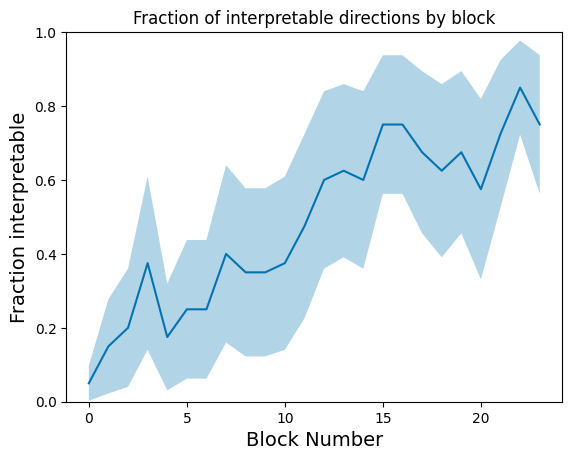

(24, 40)
(40,)
(40,)


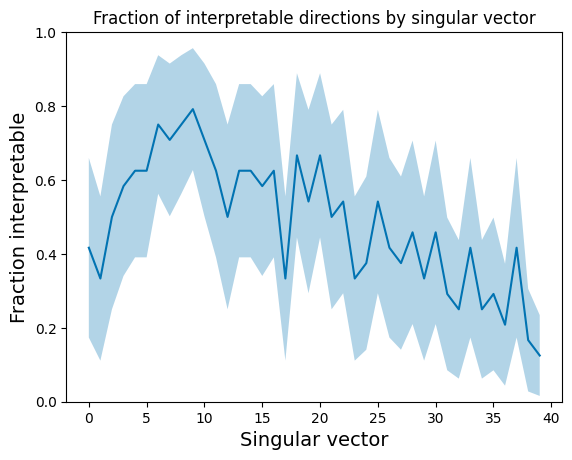

In [ ]:
plot_interpretable_by_block(mlps)
plot_interpretable_by_singular_value(mlps)

While the manually labelled data is quite noisy, several clear trends emerge. Firstly, if we plot the fraction of interpretable directions by block, we see a consistent and almost monotonic increase in the fraction of interpretable directions with depth of the block. This makes sense insofar as processing through the network should be to make information semantically relevant so as to ultimately produce a sensible output which takes into account the core semantics of language. Thus it makes sense that the later weights should be primarily acting upon interpretable (to us!) semantic subsets.

Perhaps more interesting and surprising is the singular vector distribution which roughly appears to show a U-shaped curve. The first singular values are generally not super interpretable since they tend to just respond to high (or low) frequency words and sometimes strange punctuation patterns. The middle singular vectors are often very interpretable with monosemantic clusters, and this reflects in these being the highest. As the singular vectors get smaller, they become less interpretable again, which suggests that either the network is not utilizing the space provided by these singular vectors for representations, or else that it is using them for less important and more esoteric dataset correlations that are hard for humans to understand.

From experience labelling the clusters, qualitatively, it is often correct that for some of the clusters labelled uninterpretable, it is often the case that the model is gesturing towards some kind of vague cluster you can sort of understand, but is either highly nonspecific or alternatively is clearly polysemantic.

It is also instructive to consider the distribution of interpretable directions over the singular vectors using only the highly interpretable later blocks. A very high fraction (up to 1) of the middle singular vectors end up being interpretable in these later layers but which declines rapidly at about 30 singular values. This nevertheless means that each MLP encodes a large number of highly semantically interpretable directions which can be directly read out from the weights.

(24, 40)
(40,)
(40,)


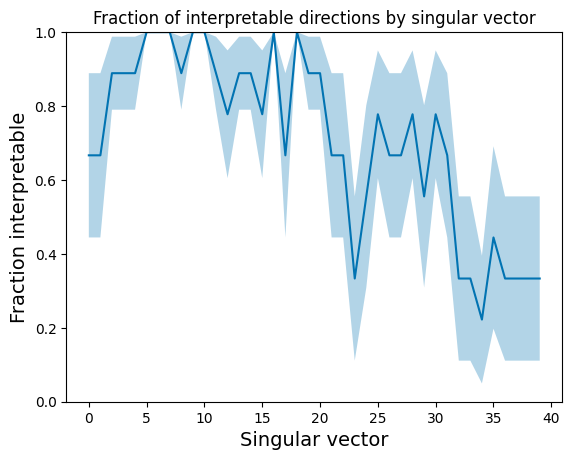

In [ ]:
plot_interpretable_by_singular_value(mlps, start_at=15)

# Entropy of the singular vectors

These plots raise the question of how much information is contained within each singular vector that the model can use. I.e. how much of the total 'representational space' is the model actually utilizing? While this is a massively unanswered and underdetermined question, we look at a very simple metric which can give a basic sense of this: the *entropy* of the singular vectors.

The intuition behind this is that underneath all of the complex representations the network can form there is a fundamental gaussianity enforced on the network's representations by the central limit theorem. At the limit, this Gaussianity must destroy any finely tuned information stored within the weights. This is what happens at the NTK limit. Heuristically, take the entropy of the singular vectors, and specifically how far they deviate from the entropy of a gaussian with the same standard deviation (the Gaussian being the maximum entropy distribution with a given mean and variance) to determine at what point the singular vectors lose information and collapse to their maximum entropy distribution.

uniform:  6.930448532104492
1022.9527038677311
(20,)


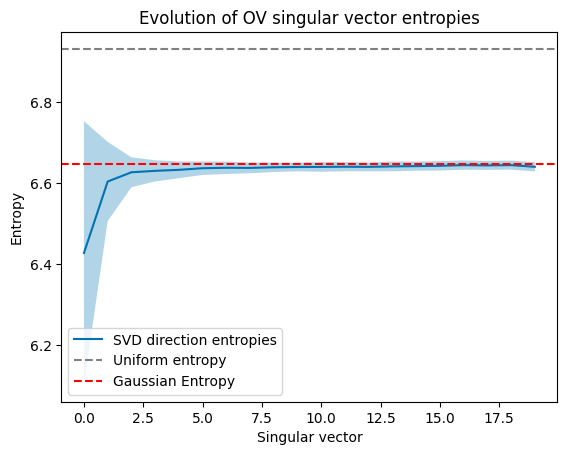

uniform:  6.930449962615967
1022.9541672143587
(20,)


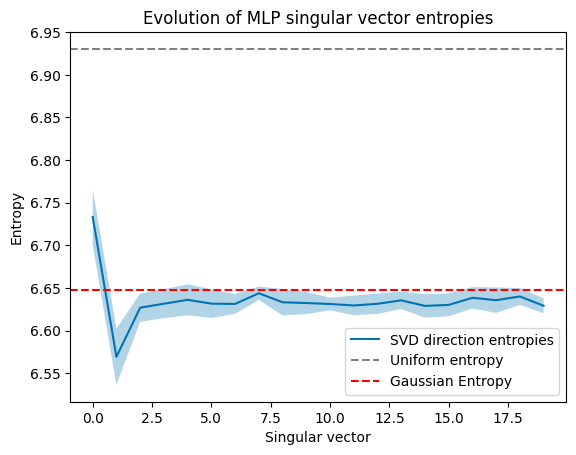

In [ ]:
def get_uniform_and_onehot_entropy(mlp=True):
  if mlp:
    uniform_entropy = normalize_and_entropy(torch.ones((1024,1)))
  else:
    uniform_entropy = normalize_and_entropy(torch.ones_like(V[0,0,:]))
  print("uniform: ", uniform_entropy)
  print(math.exp(uniform_entropy))
  onehot = torch.zeros_like(V[0,:])
  onehot[0] = 1
  onehot_entropy = normalize_and_entropy(onehot)
  return uniform_entropy, onehot_entropy

def get_all_entropies_OV(W_V_heads, W_O_heads, layer_min, layer_max, max_singvals):
    entropies = []
    for l in range(layer_min, layer_max):
        layer_entropies = []
        for n in range(num_heads):
            head_entropies = []
            W_V_tmp, W_O_tmp = W_V_heads[l, n], W_O_heads[l, n]
            OV = W_V_tmp @ W_O_tmp
            U,S,V = torch.linalg.svd(OV)
            for s in range(max_singvals):
                entropy = normalize_and_entropy(V[s,:])
                head_entropies.append(entropy)
            head_entropies = np.array(head_entropies)
            layer_entropies.append(head_entropies)
        layer_entropies = np.array(layer_entropies)
        entropies.append(layer_entropies)
    entropies = np.array(entropies)
    return entropies

def get_all_entropies_MLP(W, layer_min, layer_max, max_singvals):
    entropies = []
    for l in range(layer_min, layer_max):
        layer_entropies = []
        U,S,V = torch.linalg.svd(W[l,:,:])
        for s in range(max_singvals):
            entropy = normalize_and_entropy(V[s,:])
            layer_entropies.append(entropy)
        layer_entropies = np.array(layer_entropies)
        entropies.append(layer_entropies)
    entropies = np.array(entropies)
    return entropies

def compute_gaussian_entropy(entropies, N_samples = 10):
  std = np.std(entropies)
  mean = np.mean(entropies)
  gaussian_entropies = []
  for i in range(N_samples):
      gauss_vec = torch.randn(size=(1024,1))
      #print(gauss_vec[0:10])
      ent = normalize_and_entropy(gauss_vec)
      gaussian_entropies.append(ent)
  gaussian_ent = np.mean(np.array(gaussian_entropies))
  return gaussian_ent

def plot_singular_vector_entropies(entropies, verbose=False, title_add = ""):
  gaussian_entropy = compute_gaussian_entropy(entropies)
  if title_add == "MLP":
    uniform_entropy, onehot_entropy = get_uniform_and_onehot_entropy(mlp=True)
  else:
    uniform_entropy, onehot_entropy = get_uniform_and_onehot_entropy(mlp=False)
  if verbose:
    print("uniform entropy: ", uniform_entropy)
    print("onehot entropy: ", onehot_entropy)
    print("gaussian entropy: ", gaussian_entropy)
  if len(entropies.shape) == 3:
    mean_entropies = np.mean(entropies, axis=(0,1))
    std_entropies = np.std(entropies, axis=(0,1))
  else:
    mean_entropies = np.mean(entropies, axis=0)
    std_entropies = np.std(entropies, axis=0)
  print(mean_entropies.shape)
  xs = np.arange(0, len(mean_entropies))
  plt.plot(xs,mean_entropies,label="SVD direction entropies")
  plt.fill_between(xs, mean_entropies - std_entropies, mean_entropies + std_entropies, alpha=0.3)
  plt.axhline(uniform_entropy, label="Uniform entropy",color='gray', linestyle='dashed')
  plt.axhline(gaussian_entropy, label="Gaussian Entropy", color='red', linestyle='dashed')
  plt.legend()
  plt.ylabel("Entropy")
  plt.xlabel("Singular vector")
  plt.title("Evolution of " + title_add + " singular vector entropies")
  plt.show()



entropies = get_all_entropies_OV(W_V_heads, W_O_heads,layer_min = 15, layer_max = 23, max_singvals = 20)
plot_singular_vector_entropies(entropies, title_add = "OV")

entropies = get_all_entropies_MLP(K,layer_min = 15, layer_max = 23, max_singvals = 20)
plot_singular_vector_entropies(entropies,title_add = "MLP")

If we plot this, we see that the entropy of the singular vectors stars out significantly below that of a random gaussian but rapidly converges to it, with convergence being complete by about singular vector 10, at which point we also tend to stop seeing highly interpretable semantic clusters in the singular vectors.

Interestingly, this story does not appear to hold for the MLP vectosr which rapidly converge to the Gaussian entropy despite having highly interpretable singular vectors at much greater depths. This implies that somehow although the singular vectors are highly entropic, they nevertheless encode deeply semantically interpretable dimensions in their direction. This suggests a 'direction maximalist' viewpoint whereby the singular vectors do not at all align with the neuron basis (which would result in low entropy), and indicates that if inspecting neurons we should expect a very high degree of polysemanticity.

# Experiments with automated direction labelling

In the previous section, we manually hand-labelled all of the directions in the MLP_IN weights of GPT2-medium. However, this was a significant time commitment and is not scalable. We estimate it took about 6 hours of focused work to hand-label all of the SVD directions of the FC_in weights in GPT2-medium for 40 singular directions. At 24 MLP blocks this comes to 960 directions to label and a rate of about 3 directions a minute, which could potentially be improved but not by orders of magnitude. For larger networks and for the OV patterns where there are a large number of heads, the numbers of SVD directions rapidly become unmangeable. For instance, with 16 heads, if we wanted to label 50 SVD directions for all of the OV circuits in GPT2-medium, this would correspond to 19200 directions and about 100 hours of work. For GPT2-XL with 48 layers and 25 heads, for 50 SVD directions this comes to 60000 directions in total which would take about 330 hours to hand-label.

To get a more thorough and widespread quantitative estimate of the degree of interpretability, we experimented with automatic labelling of directions, namely asking a large language model (GPT3) to come up with potential semantic labels for each dimension, or else tell us that the dimension was not interpretable. This has the advantage of being much more scalable with the cost of being potentially noisy and biased by quirks of the labelling-LLM as well as somewhat dependent upon details of the prompt.





We experimented a lot with different prompt types including zero-shot prompting, chain of thought, and sampling approaches. We found that the model was sometimes surprisingly good at zero-shot but that it tended to reply in a number of different formats which were hard to parse automatically and it exhibited a lot of noise in its responses.

 Few shot examples definitely helped the model a good deal, both in nailing down the desired response format and also in improving its accuracy at giving a sensible answer. We found that performance was highly sensitive to the number and type of few-shot examples, with often the model being strongly influenced by the relative number of positive vs negative examples (if too many positives, it invents some explanation for clearly non interpretable directions; if too many negatives, it just says that everything is uninterpretable). The model also often fixated on the few shot examples in the prompt -- i.e. saying everything is about fire if there is an example of fire in the prompt. We found that performance was often non-monotonic in the number of few-shot examples and could sometimes be severely degraded by adding another few shot example.

 We experimented with both the standard GPT3 model (Davinci) and the Instruct-GPT3 (text-davinci-002) models. We found the instruct model gave substantially superior performance in that it actually tended to follow the desired format and give correct answers. Davinci's behaviour was much more variable and it especially tended to ignore the question and just invent new singular directions instead.

 We tried sampling 'best-of' approaches and found that they did not work because the model tended to be highly certain in its answer, even clearly incorrect ones, and that this behaviour persisted at high temperatures (at super high temperatures the model's outputs are random, and we did not manage to find a region in which the model's outputs are relevant but high entropy). We believe this is related to the phenomenon of [mode collapse in the Instruct models](https://www.lesswrong.com/posts/t9svvNPNmFf5Qa3TA/mysteries-of-mode-collapse-due-to-rlhf).

One approach to improve performance that we found worked tolerably well is to use a separate 'verifier' prompt, which took in both the string of direction tokens and the previous model's outputted explanation and judge whether it was a correct interpretation or not. We found this especially useful to detect and mitigate GPT3's tendency to make up meanings for uninterpretable directions. However, it introduced its own set of noise where sometimes the verifier model would judge some sensible interpretations to be false.

A key issue we faced was the lack of ground truth correct labels against which to judge the models' or a prompt's performance. We found that our own human labelled examples were often debatable and noisy also, and that sometimes we preferred the model's judgement to our own. As such, our primary method of testing the model was to do a qualitative spot-check of the model's performance on a set of known examples. However, this approach clearly suffers from high noise and some potential bias.

In general, despite these potential pitfalls we found that the automated labelling worked surprisingly well. GPT3 often comes up with a sensible interpretation of the singular direction, and often can find interpretations that us human labellers did not find. While not perfect as a method, we believe that it roughly captures trends in the data and gives a rough estimate of the degree of interpretability. However, the approach has high noise as well as a potential systematic bias towards saying things are more interpretable than they are, which we only somewhat corrected by the verifier model.


# Autolabelling code

The following auto-labelling code will require an OpenAI API key to run and the sweeps over all models will cost a fair bit of money so be warned before running. We mainly include the code here for reproducibility of effects. The resulting data is saved in the github repository along with the notebook (-/TODO LINK TO GH).

Ultimately our prompt consisted of a short description of the task (we found framing it as a verbal aptitude test helped the model generate relevant completions), followed by a series of few-shot examples (mostly negative to counteract the positive bias of the model). We asked the model to generate a potential semantic completion at the end. This was parsed as not-interpretable if the model said 'these words have no semantic meaning' and as positive if the model's output has 'these words' in it, which we found a good detector of whether the model's response is on-topic. With few-shot examples the model is very good at staying on topic and responding in the desired format.

Our verifier prompt also consisted of a short description of the task, followed by another set of few-shot examples. The model's output was simply 'yes' it is a correct interpretation or 'no' it is not.

In [ ]:
import openai
openai.api_key = "<YOUR API KEY HERE>"

ModuleNotFoundError: ignored

In [ ]:
def check_semantic_direction(test_str, k = 10, use_examples = True, make_completion = True, temperature = 0.5, model_name = "text-davinci-002"):
    #fire_str =  list_to_comma_separated_string(remove_hashes(top_tokens(test_V[1,:].float() @ emb, k = k)))
    fire_str = "fire, Fire, burn, fires, FIRE, Fire, flames, burning, Burn, blaze, Burn, burns, fire, burner, flame"
    #meaningless_str =  list_to_comma_separated_string(remove_hashes(top_tokens(test_V[19,:].float() @ emb, k = k)))
    meaningless_str = "balloons, balloon, Wind, feather, ray, flying, Wings, FAA, ream, Wind, Winged, egg, Balloon, Render, Render"
    animal_str = "Pupp, Dog, dog, kitten, puppy, dogs, Dog, Veter, puppies, kittens, veterinarian, cat, Dogs, Cat, Vet"
    #smoke_str =  list_to_comma_separated_string(remove_hashes(top_tokens(test_V[6,:].float() @ emb, k = k)))
    #meaningless_str_2 =  list_to_comma_separated_string(remove_hashes(top_tokens(-test_V[101,:].float() @ emb, k = k)))
    meaningless_str_2 = "adding, ded, strat, union, oug, vation, Tele, Strat, ould, iership, older, cium, anc, STA, secondly"
    preposition_str = "the, \,, and, a, in, ., \", -, (, to, of, for, is, on, The"
    pos_adj_str = "excellent, cellent, superb, brilliant, tremend, Excellent, terrific, fantastic, impressive, pleasant, genuinely, phenomenal, unparalleled, robust, truly"
    meaningless_str_3 = "past, oats, properties, blem, coins, enson, iliate, Alley, eatured, orial, upd, leck, hua, lat, pub"
    meaningless_str_4 = "mathemat, Iran, sophistic, methamphetamine, pty, trivia, sushi, disag, byter, etry, USB, homebrew, Mahjong, onel, Figure"
    official_actions = "relevance, acknowledgement, verdict, discovery, citations, NOTICE, Response, indictment, Chance, Critical, scrutiny, rulings, glimps, notice, Progress"
    meaningless_str_5 = "ogether, total, sole, so, otal, olute, yet, complete, all, apsed, identical, Valent, unconditional, yet, eneg"
    negative_participles = "lost, missed, diminished, undone, vanished, feared, avoided, forgotten, hopeless, disappeared, fallen, removed, darkest, suspic, unavoid"


    #openai_prompt = "This is an exmaple of verbal reasoning on the SAT test. \n" # What do most of these words have in common? \n"
    #openai_prompt = "This is an exmaple of verbal reasoning on the SAT aptitude test. \n We will present lists of words. Most of these words have some shared semantic aspect or relate to a single theme. There are some distractor words. Some examples are given below: \n"
    #openai_prompt = "This is an exmaple of verbal reasoning on the SAT aptitude test. \n We will present lists of words. Most of these words have some shared semantic aspect or relate to a single theme. Some examples are given below: \n"
    #openai_prompt = "This is a verbal reasoning question on the SAT aptitude test. We will present lists of words. Most of these words have some shared semantic aspect or relate to a single theme. Some examples are given below: \n"
    # let's just try with nothing
    openai_prompt = "This is a transcript of the correct answers to a verbal aptitude test. The aim is to write down what semantic theme or concept a list of words has in common. A list of randomly selected correct examples is presented below in a random order. \n"
    openai_prompt += "If the words share a concept write: \"most of these words are X\". If they do not share a semantic concept write: \"these words have no shared semantic meaning\".  \n"

    if use_examples:
        openai_prompt += "What do most of these words have in common? \n"
        openai_prompt += preposition_str + " \n"
        openai_prompt += "Answer: most of these words are prepositions. \n"
        #openai_prompt += "What do most of these words have in common? \n"
        #openai_prompt += negative_participles + " \n"
        #openai_prompt += "Answer: most of these words are negative participles. \n"
        openai_prompt += "What do most of these words have in common? \n"
        openai_prompt += meaningless_str_3 + " \n"
        openai_prompt += "Answer: these words have no shared semantic meaning. \n"
        #openai_prompt += "What do most of these words have in common? \n"
        #openai_prompt += official_actions + " \n"
        #openai_prompt += "Answer: most of these words relate to official actions or processes. \n"
        openai_prompt += "What do most of these words have in common? \n"
        openai_prompt += meaningless_str_4 + " \n"
        openai_prompt += "Answer: these words have no shared semantic meaning. \n"
        openai_prompt += "What do most of these words have in common? \n"
        openai_prompt += meaningless_str_5 + " \n"
        openai_prompt += "Answer: these words have no shared semantic meaning. \n"
        #openai_prompt += "What do most of these words have in common? \n"
        #openai_prompt += pos_adj_str + " \n"
        #openai_prompt += "Answer: most of these words are positive adjectives. \n"
        #openai_prompt += "What do most of these words have in common? \n"
        #openai_prompt += meaningless_str + " \n"
        #openai_prompt += "Answer: these words have no shared semantic meaning \n"
        openai_prompt += "What do most of these words have in common? \n"
        openai_prompt += animal_str + " \n"
        openai_prompt += "Answer: most of these words relate to animals. \n"
        openai_prompt += "What do most of these words have in common? \n"
        openai_prompt += meaningless_str_2 + " \n"
        openai_prompt += "Answer:these words have no shared semantic meaning \n"
        #openai_prompt += "What do most of these words have in common? \n"
        #openai_prompt += smoke_str + " \n"
        #openai_prompt += "Answer: most of these words relate to smoking \n"

    openai_prompt += "What do most of these words have in common? \n "
    #openai_prompt += "What do most of these words have in common? \n Let's think step by step"
    openai_prompt += test_str + " \n"
    openai_prompt += "Answer:"
    print("test str: ", test_str)
    if make_completion:
        if model_name is None:
            model_name = "text-davinci-002"

        openai_output = openai.Completion.create(
        engine = model_name,
        prompt=openai_prompt,
        max_tokens=10,
        temperature=temperature
        )
        out_text = openai_output.choices[0]["text"].strip().lower()
        print("output: ", out_text)
        if "these words" in out_text and not "no shared semantic meaning" in out_text:
            print("YES")
            return 1, openai_prompt, out_text
        elif "no shared semantic meaning" in out_text:
            print("NO")
            return 0, openai_prompt, out_text
        else:
            print("ERROR")
            return -1, openai_prompt, out_text
    else:
        return openai_prompt


In [ ]:
def consistency_check(test_str, output_str, use_examples = True, make_completion = True, temperature = 0.0, model_name = "text-davinci-002", output_len=10):

    fire_str = "fire, Fire, burn, fires, FIRE, Fire, flames, burning, Burn, blaze, Burn, burns, fire, burner, flame"
    #meaningless_str =  list_to_comma_separated_string(remove_hashes(top_tokens(test_V[19,:].float() @ emb, k = k)))
    air_str = "balloons, balloon, Wind, feather, ray, flying, Wings, FAA, ream, Wind, Winged, egg, Balloon, Render, Render"
    animal_str = "Pupp, Dog, dog, kitten, puppy, dogs, Dog, Veter, puppies, kittens, veterinarian, cat, Dogs, Cat, Vet"
    #smoke_str =  list_to_comma_separated_string(remove_hashes(top_tokens(test_V[6,:].float() @ emb, k = k)))
    #meaningless_str_2 =  list_to_comma_separated_string(remove_hashes(top_tokens(-test_V[101,:].float() @ emb, k = k)))
    meaningless_str_2 = "adding, ded, strat, union, oug, vation, Tele, Strat, ould, iership, older, cium, anc, STA, secondly"
    preposition_str = "the, \,, and, a, in, ., \", -, (, to, of, for, is, on, The"
    pos_adj_str = "excellent, cellent, superb, brilliant, tremend, Excellent, terrific, fantastic, impressive, pleasant, genuinely, phenomenal, unparalleled, robust, truly"
    meaningless_str_3 = "past, oats, properties, blem, coins, enson, iliate, Alley, eatured, orial, upd, leck, hua, lat, pub"
    meaningless_str_4 = "mathemat, Iran, sophistic, methamphetamine, pty, trivia, sushi, disag, byter, etry, USB, homebrew, Mahjong, onel, Figure"
    official_actions = "relevance, acknowledgement, verdict, discovery, citations, NOTICE, Response, indictment, Chance, Critical, scrutiny, rulings, glimps, notice, Progress"
    meaningless_str_5 = "ogether, total, sole, so, otal, olute, yet, complete, all, apsed, identical, Valent, unconditional, yet, eneg"
    negative_participles = "lost, missed, diminished, undone, vanished, feared, avoided, forgotten, hopeless, disappeared, fallen, removed, darkest, suspic, unavoid"

    prompt = "We are judging whether a proposed semantic interpretation of a list of words makes sense. An ideal interpretation would correctly identify a syntactic or semantic regularity among the list of words. \n"
    prompt += "You will be given a question: with a list of words, and an answer with a proposed interpretation. You must answer 'yes' if the answer correctly identifies the syntactic or semantic commonalities of the list of words in the question, and 'no' otherwise. \n"
    if use_examples == True:
        prompt += "A random list of examples is given below: \n"
        prompt += "List: " + animal_str + " \n"
        prompt += "Interpretation: most of these words relate to animals. \n"
        prompt += "Answer: yes \n"
        prompt += "List: " + air_str + "\n"
        prompt += "Interpretation: these words relate to the air or flying. \n"
        prompt += "Answer: yes \n"
        prompt += "List: " + meaningless_str_2 + "\n"
        prompt += "Interpretation: most of these words are nouns \n"
        prompt += "Answer: no \n"
        prompt += "List: " + meaningless_str_3 + "\n"
        prompt += "Interpretation: most of these words are verbs \n"
        prompt += "Answer: no \n"
        prompt += "List: " + negative_participles + "\n"
        prompt += "Interpretation: most of these words are verbs \n"
        prompt += "Answer: yes \n"
        prompt += "List: " + meaningless_str_4 + "\n"
        prompt += "Interpretation: these words have no shared semantic meaning \n"
        prompt += "Answer: yes \n"

    prompt += "List: " + str(test_str) + " \n"
    prompt += "Interpretation: " + str(output_str) + " \n"
    prompt += "Answer:"

    if make_completion:
        if model_name is None:
            model_name = "text-davinci-002"
        openai_output = openai.Completion.create(
        engine = model_name,
        prompt=prompt,
        max_tokens=output_len,
        temperature=temperature
        )
        out_text = openai_output.choices[0]["text"].strip().lower()
        print("output: ", out_text)
        if "yes" in out_text:
            print("YES")
            return 1, prompt, out_text
        elif "no" in out_text:
            print("NO")
            return 0, prompt, out_text
        else:
            print("ERROR")
            return -1, prompt, out_text
    else:
        return prompt






To get a feel for what these prompts look like in practice, we print them out here

In [ ]:
# main semantic checking prompt
print(check_semantic_direction(test_str = "1 2 3",make_completion = False))

test str:  1 2 3
This is a transcript of the correct answers to a verbal aptitude test. The aim is to write down what semantic theme or concept a list of words has in common. A list of randomly selected correct examples is presented below in a random order. 
If the words share a concept write: "most of these words are X". If they do not share a semantic concept write: "these words have no shared semantic meaning".  
What do most of these words have in common? 
the, \,, and, a, in, ., ", -, (, to, of, for, is, on, The 
Answer: most of these words are prepositions. 
What do most of these words have in common? 
past, oats, properties, blem, coins, enson, iliate, Alley, eatured, orial, upd, leck, hua, lat, pub 
Answer: these words have no shared semantic meaning. 
What do most of these words have in common? 
mathemat, Iran, sophistic, methamphetamine, pty, trivia, sushi, disag, byter, etry, USB, homebrew, Mahjong, onel, Figure 
Answer: these words have no shared semantic meaning. 
What do 

In [ ]:
# verifier prompt
print(consistency_check(test_str = "1 2 3",output_str = "4,5,6", make_completion = False))

We are judging whether a proposed semantic interpretation of a list of words makes sense. An ideal interpretation would correctly identify a syntactic or semantic regularity among the list of workds. 
You will be given a question: with a list of words, and an answer with a proposed interpretation. You must answer 'yes' if the answer correctly identifies the syntactic or semantic commonalities of the list of words in the question, and 'no' otherwise. 
A random list of examples if given below: 
List: Pupp, Dog, dog, kitten, puppy, dogs, Dog, Veter, puppies, kittens, veterinarian, cat, Dogs, Cat, Vet 
Interpretation: most of these words relate to animals. 
Answer: yes 
List: balloons, balloon, Wind, feather, ray, flying, Wings, FAA, ream, Wind, Winged, egg, Balloon, Render, Render
Interpretation: these words have no shared semantic meaning. 
Answer: yes 
List: adding, ded, strat, union, oug, vation, Tele, Strat, ould, iership, older, cium, anc, STA, secondly
Interpretation: most of these 

In [ ]:
# some utility function
import json
def remove_hashes(l):
    new_l = []
    for el in l:
        s = el
        s = s.replace("#","")
        new_l.append(s)
    return new_l

def list_to_comma_separated_string(l):
    s = ""
    for el in l:
        s+= str(el) + ", "
    return s[:-2]

def get_mlp_in_V(model):
    W = model.get_parameter(f"transformer.h.{j}.mlp.c_fc.weight").T.detach()
    U,S,V = torch.linalg.svd(W)
    return V

def get_mlp_out_V(model):
    W = model.get_parameter(f"transformer.h.{j}.mlp.c_proj.weight").T.detach()
    U,S,V = torch.linalg.svd(W)
    return V

def get_model_responses(model_name,mlp_type, mlp_layer,direction,save_base = "svd_automi/json_data/"):
  # load json file and parse
  model_type = model_name.split("-")[1]
  with open(save_base + model_type + "_" + mlp_type + "_text_outputs.json",'r') as json_data:
      json_str = json_data.read()
      json_dict = json.loads(json_str)
      json_data.close()
  result_dict = json_dict["layer_" + str(mlp_layer)]["direction_" + str(direction)]
  return result_dict

def print_result(result_dict):
  print("SVD direction: " + str(result_dict["test_string"]))
  print("Model response: " + str(result_dict["response"]))
  print("Verifier response: " + str(result_dict["verifier_response"]))

In [ ]:
def sweep_mlp_layers(model,emb, model_name, k=15, N_singular_vectors=30, mlp_fn = get_mlp_in_V, save_base = "svd_automi/", prompt_function = check_semantic_direction):
    model_str = model_name.replace("-","_")
    num_layers, num_heads, hidden_dim, head_size = get_model_info(model)
    corrects_list = []
    text_dict = {}
    for n in range(num_layers):
        corrects = []
        V = mlp_fn(n)
        layer_dict = {}
        for i in range(N_singular_vectors):
            sing_dict = {}
            test_str =  list_to_comma_separated_string(remove_hashes(top_tokens(V.T[i,:].float() @ emb, k = k)))
            val, prompt, out_text = prompt_function(test_str, k, use_examples = True)
            corrects.append(val)
            sing_dict["test_str"] = test_str
            sing_dict["out_text"] = out_text
            layer_dict["singval_" + str(i)] = sing_dict

        text_dict["layer_" + str(n)] = layer_dict
        corrects_list.append(np.array(corrects))
        np.save(save_base + model_str + "_svd_corrects_list.npy", corrects_list)
        json_str = json.dumps(text_dict)
        json_sname = save_base + model_str + "_svd_prompts_outputs.json"
        with open(json_sname, "w") as f:
            f.write(json_str)
            f.close()
    corrects_list = np.array(corrects_list)
    np.save(save_base + model_str + "_svd_corrects_list.npy", corrects_list)
    json_str = json.dumps(text_dict)
    json_sname = save_base + model_str + "_svd_prompts_outputs.json"
    with open(json_sname, "w") as f:
        f.write(json_str)
        f.close()
    return corrects_list, text_dict

In [ ]:
# perform a sweep over a given model
mlp_in_corrects_list, mlp_in_text_dict, verifier_mlp_in_corrects_list, verifier_mlp_in_text_dict = sweep_mlp_layers_with_verifiers(model, emb, model_name, k=15, N_singular_vectors=30, mlp_fn = get_mlp_in_V, save_base = "svd_automi/verifier_mlp_in_")
mlp_out_corrects_list, mlp_out_text_dict, verifier_mlp_in_corrects_list, verifier_mlp_in_text_dict = sweep_mlp_layers_with_verifiers(model, emb, model_name, k=15, N_singular_vectors=30, mlp_fn = get_mlp_out_V, save_base = "svd_automi/verifier_mlp_out_")

All of the model and verifier's responses are stored in json files in the associated repo. To get a feel for them, we reccomend playing around with this utility function to query the data.

In [ ]:
responses = get_model_responses(model_name="gpt2-medium", mlp_type="mlp_in", mlp_layer=23, direction=9, save_base = "")
print_result(responses)

SVD direction: libraries, redist, utilities, finance, nond, imports, aggreg, subsidiaries, intermedi, deferred, deleg, forestry, divest, bund, multip
Model response: most of these words relate to business.
Verifier response: yes


In [ ]:
responses = get_model_responses(model_name="gpt2-medium",mlp_type="mlp_out", mlp_layer=16,direction=4,save_base = "")
print_result(responses)

SVD direction: fewer, lack, lacks, weak, nothing, lacking, lacked, poorly, deficient, lousy, insufficient, nonexistent, lessness, weaker, less
Model response: most of these words are negative words.
Verifier response: yes


Now let's do some more general plots

In [ ]:
# plotting functions

import os
os.makedirs("figures/")

def plot_interpretables_by_model(save_base = "svd_automi/"):
    gpt_bases = ["small","medium","large"]
    mlp_types = ["mlp_in", "mlp_out"]
    fig_base = save_base + "figures/"

    for mlp_type in mlp_types:
        fig = plt.figure()
        for gpt_base in gpt_bases:
            in_corrects_list = np.load(save_base + "verifier_"+mlp_type+"_gpt2_"+gpt_base+"_svd_corrects_list.npy")
            in_verifier_corrects_list = np.load(save_base + "verifier_"+mlp_type+"_gpt2_"+gpt_base+"_verifier_svd_corrects_list.npy")
            mean_in_corrects = np.mean(in_corrects_list & in_verifier_corrects_list, axis=1)
            plt.plot(mean_in_corrects, label=gpt_base)
        plt.xlabel("Block", fontsize=18)
        plt.ylabel("Fraction directions interpretable", fontsize=18)
        plt.legend()
        plt.title("Fraction interpretable " + str(mlp_type.replace("_"," ")),fontsize=18)
        plt.tight_layout()
        plt.savefig(fig_base + "interpretable_by_model_" + str(mlp_type) + ".png", format="png")
        plt.show()

def plot_interpretables_by_mlp_type(save_base = "svd_automi/"):
    gpt_bases = ["small","medium","large"]
    mlp_types = ["mlp_in", "mlp_out"]
    fig_base = save_base + "figures/"

    for gpt_base in gpt_bases:
        fig = plt.figure()
        for mlp_type in mlp_types:
            in_corrects_list = np.load(save_base + "verifier_"+mlp_type+"_gpt2_"+gpt_base+"_svd_corrects_list.npy")
            in_verifier_corrects_list = np.load(save_base + "verifier_"+mlp_type+"_gpt2_"+gpt_base+"_verifier_svd_corrects_list.npy")
            mean_in_corrects = np.mean(in_corrects_list & in_verifier_corrects_list, axis=1)
            plt.plot(mean_in_corrects, label=mlp_type)
        plt.xlabel("Block", fontsize=18)
        plt.ylabel("Fraction directions interpretable", fontsize=18)
        plt.legend()
        plt.title("Fraction interpretable GPT2 " + str(gpt_base),fontsize=18)
        plt.tight_layout()
        plt.savefig(fig_base + "interpretable_by_mlp_type_" + str(gpt_base) + ".png", format="png")
        plt.show()

def plot_all_directions(save_base = "svd_automi/"):
    colors = ['red','green','blue']
    gpt_bases = ["small","medium","large"]
    mlp_types = ["mlp_in", "mlp_out"]
    fig_base = save_base + "figures/"
    line_styles = ['solid','dashed']

    fig = plt.figure()
    for i,gpt_base in enumerate(gpt_bases):
        for j,mlp_type in enumerate(mlp_types):
            in_corrects_list = np.load(save_base + "verifier_"+mlp_type+"_gpt2_"+gpt_base+"_svd_corrects_list.npy")
            in_verifier_corrects_list = np.load(save_base + "verifier_"+mlp_type+"_gpt2_"+gpt_base+"_verifier_svd_corrects_list.npy")
            mean_in_corrects = np.mean(in_corrects_list & in_verifier_corrects_list, axis=0)
            plt.plot(mean_in_corrects, label="gpt2-" + str(gpt_base) + " " + str(mlp_type), color = colors[i], linestyle = line_styles[j], linewidth = 2)
    plt.xlabel("Direction", fontsize=18)
    plt.ylabel("Fraction directions interpretable", fontsize=18)
    plt.legend()
    plt.title("Fraction of interpretable directions",fontsize=18)
    plt.tight_layout()
    plt.savefig(fig_base + "directions_interpretable_fraction.png", format="png")
    plt.show()


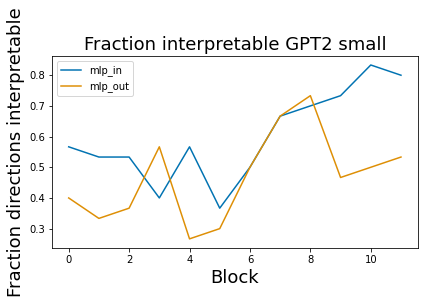

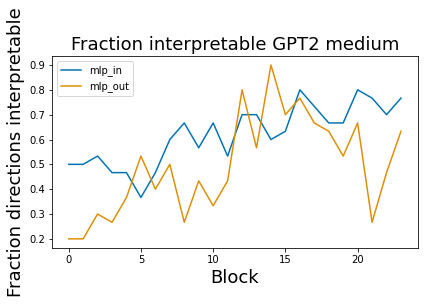

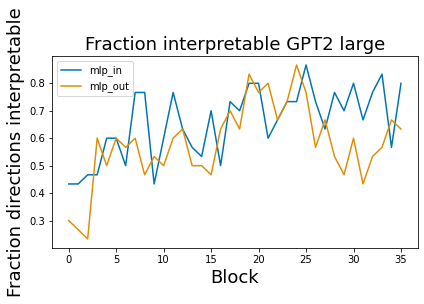

In [ ]:
plot_interpretables_by_mlp_type(save_base = "")


If we plot the fraction of interpretable directions found in each model of gpt2-small, medium, and large, we find a consistent pattern of the fraction of interpretable directions increasing across block size -- often from about 40-50% of the directions being interpretable to about 80-90%. We see no super clear differences between the input and output mlp weights, although the data is pretty noisy so there is no clear effect. Overall, however, it is clear that across the suite of GPT2 models, a very substantial fraction of the svd directions are interpretable, showing that it is not just a weird artefact of GPT2.

Interestingly, however, the effect we qualitatively observe, of the middle layers of GPT2-medium FC_OUT being consistently easier to interpret and the other being difficult is supported in this graph, but only for GPT2-medium. While the pattern is hard to see in GPT2-small due to the small number of blocks, in GPT2-large the pattern seems potentially extant but much less pronounced.

It is also possible to present the data in another way: plotting the fraction of interpretable blocks from each model on the same plot. Here we observe that the smaller models seem to reach roughly the same fraction of interpretable directions as the large ones, although the large ones take longer as they have more blocks.

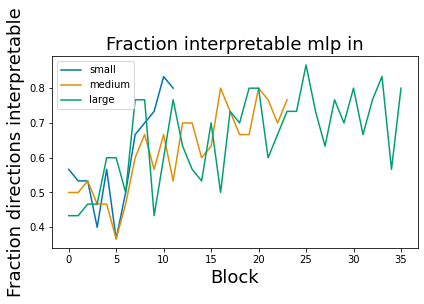

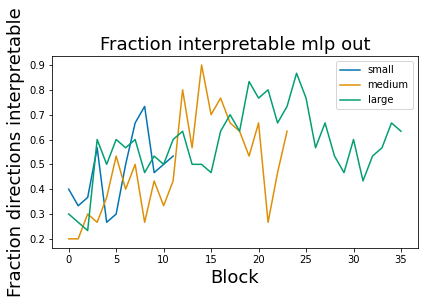

In [ ]:
plot_interpretables_by_model(save_base = "")

Finally, it is also instructive to compare the fraction of interpretable directions across the singular directions themselves across all models. Here we see that a roughly consistent fraction of about 70-80% of directions are interpretable for all models, and that this does not appear to change up to 30 directions. This implies that in some sense the semanticity of the directions appears largely invariant to scaling (at least within the model scales of the GPT2 family, as well as that MLP SVD directions are 'deep' in that they maintain coherence up to 30 dimensions in, while the OV circuits qualitatively often start degrading around then. Clearly, to see a fall-off we need to measure more singular vectors, and were here primarily constrained by the cost of querying the OpenAI API. This is thus left to future work.

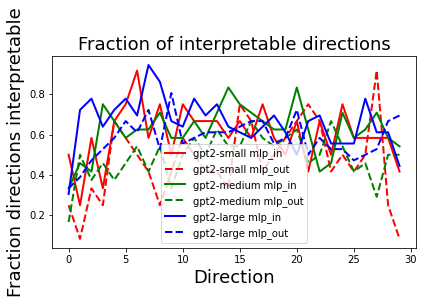

In [ ]:
plot_all_directions(save_base = "")

Overall, despite being highly noisy, our automated labelling approach appears to be largely consistent, but quantified our qualitative insights from before: that most SVD directions are highly interpretable, that interpretability increases in later blocks, but is always present in earlier ones, and that the MLPs are deep in their semantic meaning such that many of their singular vectors are highly interpretable. They also serve as proof of principle that automated labelling approaches work and can scale to perform comprehensive sweeps of reasonably sized models (up to a billion parameters in the GPT2 family).

# SVD tracing: locating semantics with natural language prompts

While thus far we have taken a largely qualitative approach and simply looked at the semantic clusters, it would be helpful to be able to automate this approach, and specifically be able to have an automated method for *locating semantic processing within the network*. Specifically, it would be helpful to be able to scan a network and determine where processing of a given set of concepts is taking place.

We show that our SVD direction approach provides an initial ability to do this with a fair degree of reliability. Because we project the weight matrices to token space, we can allow querying of the weights of the network with *arbitrary natural language queries* and to find the weight matrix directions that most align with these queries.

The fundamental idea is that given a natural language query $q$, we can project it to the embedding space of the network using the embedding function.

$\hat{x} = q E$

We can then simply compare the similarity of the embedding with that of the singular vectors of all of the relevant weight matrices

$sim(\hat{x}, v_i)$

using a similarity function $\text{sim}$ which we define as the cosine similarity. We can then compare the similarities of all the singular vectors of an MLP weight matrix or attention head and compute the top-k largest, or all of those above a threshold.

We can validate that when given queries close to the projected singular values matches with the correct singular values, and also that this method can discover new associations for a given natural language query.

For instance, we know that singular vector 1 of the OV circuit of layer 22 head 1 is associated with fire. We can find this head by inputing a bunch of fire related words into the svd trace algorithm. Interestingly, this approach also tends to return the antipodal representation -- here of 'ice/frozen' and of 'rain' as well since they have strong negative cosine similarities.



In [ ]:
def svd_trace(model,tokens, layer_idx, N_singular_vectors = 20, sim_threshold = 0.15):
  emb = model.get_output_embeddings().weight.data.T.detach()
  token_list = tokenizer.encode(tokens)
  embed_dist = torch.zeros(emb.shape[1]).cuda()
  embed_dist[token_list] = 1
  # project to embedding space
  embed_proj = embed_dist @ torch.linalg.pinv(emb)
  # normalize
  embed_proj = embed_proj / torch.sum(embed_proj)

  head_sims = []
  for n in range(num_heads):
      W_V_tmp, W_O_tmp = W_V_heads[layer_idx, n], W_O_heads[layer_idx, n]
      OV = W_V_tmp @ W_O_tmp
      U,S,V = torch.linalg.svd(OV)
      sims = []
      for i in range(N_singular_vectors):
          sim = cosine_sim(embed_proj, V[i,:]).item()
          if sim <=sim_threshold and sim >=-sim_threshold:
              sims.append(0)
          else:
              print("SIM FOUND: " + str(n) + " " + str(i) + " " + str(sim))
              sims.append(sim)
              emb_proj = V[i,:] @ emb
              topk, indices = emb_proj.topk(k=20)
              print("Found tokens:", tokenizer.decode(indices))
      sims = np.array(sims)
      head_sims.append(sims)
  head_sims = np.array(head_sims)
  plt.imshow(head_sims)
  plt.xticks(np.arange(0, N_singular_vectors))
  plt.yticks(np.arange(0, num_heads))
  plt.title("Similarities layer :" + str(layer_idx))
  plt.ylabel("Head number")
  plt.xlabel("Singular vector")
  plt.show()
  return head_sims

SIM FOUND: 3 1 0.4961230456829071
Found tokens:  frost Snow ice cold chilledSnow frozen Frost Frozen freezing chilling froze freezes freeze Winter Cold snow colder Icecold
SIM FOUND: 3 3 -0.2002030313014984
Found tokens: Rain flood Wet floods RainWater Harvey rainfallwater flooding rain wet Flood water Water thirsty moisture salty waterproofSexual
SIM FOUND: 3 7 -0.22919926047325134
Found tokens:  Frost frost icy chilled ice Torch flame cold freezingIce Ice Glac warmth burns colder frozen heating Freeze FlamesCold


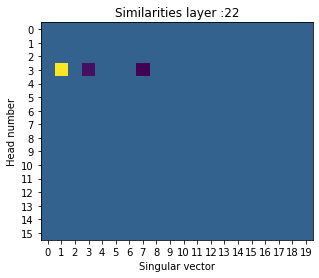

In [ ]:

tokens = "burn Fire Fire fires Burn Burn burning flames blaze burns burner fire burning Burning Fired flame"
#tokens = "flames blaze burns burner fire Fired flame"
#tokens = "Snow ice cold chilled Frost frozen Frozen chilling snow colder freezing froze winter freezes freeze"
#tokens = "state country politics governor michigan tennessee england government "
#tokens = "city urban beijing london paris berlin washington district downtown"
#tokens = "burning firefighter blaze"
#tokens = "dogs puppy dog Dog Cat cat canine vetinary pet"
#tokens = "newspaper news write read record report written twitter journalist investigator investigate reporter"
#tokens = "happiness sunshine joy wellbeing health contentment peace enlightenment"
#tokens = "republican democrat trump hillary pundit news obama president america"
#tokens = "the , a ; and ) \' \""
#tokens = "saturday sunday monday tuesday wednesday thursday friday time morning evening winter summer autumn fall spring"
#tokens = "researcher investigator reporter writer commentator #earcher professor researcher #Reviewer foe writer instructor" #pund', 'colleague', '#iever', '#being', 'analyst', 'newcomer', 'reporter', 'counselor', '#rower', 'agent', 'politician', '#agonist', 'novelist', 'physicist', 'blogger', 'staffer', 'Dane', 'campaigner', 'teammate', 'psychologist', 'apostle', 'lawmaker']
#tokens = "1000 1200 1900 1800 1700 9000 2020 1845 1942 1943 1940 1995"

head_sims = svd_trace(model,tokens, layer_idx=22)


In terms of technical details, we set the threshold to $0.15$ cosine similarity which we find can adequately match to the most similar representations while not including interference from other unrelated vectors. Overall, however, the translation process of embedding and de-embedding a singular vector is noisy and we can preserve only about a $0.5$ cosine similarity even when utilizing the top-k tokens of a singular vector of a weight matrix directly as the query. We are unclear why this is the case and think that this method can be much improved by better similarity functions or other approaches. We also find that the embedding step is too lossy if we just use the standard embedding matrix $E$, since it is not completely orthogonal, and that using the pseudoinverse of the de-embedding matrix ${E^T}^{\dagger}$ works significantly better.



# Directly editing SVD representations

While being able to look at and locate the semantics of individual heads or MLP blocks in terms of their singular vectors is highly useful for getting an understanding of what the network is doing, our approach also provides a preliminary way to *edit the knowledge* of the network. Specifically, suppose we no longer want the network to represent some SVD direction, a little linear algebra enables us to simply *subtract out* this direction from the weight matrix with an incredibly simple low-rank update.

Specifically, recall the matrix definition of the SVD $M = U S V$. Using the orthogonality of the singular vectors, we can break apart this matrix expression into a sum of low-rank updates,

$M = \sum_{i=1}^{\text{rank}(M)} S_i * U_i V_i^T$

Where $S_i$ is the ith singular vector, and $U_i$ and $V_i$ are the i'th columns of the left and right singular vector matrices. Given this sum, it is straightforward to see that we can a similar matrix but without this singular vector with the rank one update

$\hat{M} = M - S_i * U_i V_i^T$

The code for the low rank update is relatively straightforward and can be seen next.

In [ ]:
def single_rank_update(A ,idx):
    U,S,V = torch.linalg.svd(A)
    singval = S[idx]
    Vvec = V[idx,:]
    Uvec = U[:,idx]
    Uvec = Uvec.reshape(len(Uvec),1)
    Vvec = Vvec.reshape(len(Vvec),1)
    low_rank_update = singval * (Uvec @ Vvec.T)
    B = A - low_rank_update
    return B, low_rank_update

def subtract_singular_vector(OV, layer_idx, head_idx, update_idx, verbose = False):
    with torch.no_grad():
      new_OV = torch.tensor(OV, dtype=torch.float64)
      new_OV, _ = single_rank_update(new_OV,update_idx)
    # SVD and re-put together the new updatd matrix
      U, S, V = torch.linalg.svd(new_OV)
      Sdiag = torch.diag_embed(S)
      S64 = Sdiag[0:head_size, 0:head_size]
      S64sqrt = torch.sqrt(S64)
      M1 = U[:, 0:head_size] @ S64sqrt
      M2 =  S64sqrt @ V[0:head_size,:]
      OV_redone = M1 @ M2
      if verbose:
        print("dist: ", torch.dist(OV_redone, new_OV))

      # apply the update to the model weights
      WO22 = rgetattr(model,f"transformer.h.{layer_idx}.attn.c_proj.weight").detach()
      WO22[head_idx * head_size: (head_idx + 1) * head_size,:] = deepcopy(M2) #
      rsetattr(model,f"transformer.h.{layer_idx}.attn.c_proj.weight", torch.nn.Parameter(WO22))
      V2 = rgetattr(model,f"transformer.h.{layer_idx}.attn.c_attn.weight")[:, 2 * hidden_dim:].detach()
      V2[:,head_idx * head_size:(head_idx+1)*head_size] = deepcopy(M1)
      qkv = rgetattr(model,f"transformer.h.{layer_idx}.attn.c_attn.weight").detach()
      qkv[:, 2 * hidden_dim:] = V2
      rsetattr(model,f"transformer.h.{layer_idx}.attn.c_attn.weight", torch.nn.Parameter(qkv))

Let's see this in action. We take our original OV circuit,

In [ ]:
OV = OV_top_singular_vectors(W_V_heads, W_O_heads, emb,layer_idx=22, head_idx=10,N_singular_vectors=10,k=20, with_negative=True, return_OV=True, all_tokens = all_tokens)

Suppose we no longer like the first singular vector involving writing. We can remove this direction with a low rank update

In [ ]:
OV_updated, low_rank_update = single_rank_update(OV, 1)

Let's now look at the singular vectors of the newly updated matrix.

Unfortunately, the change is hard to see because due to the ambiguity of the singular vectors, when we recompute the SVD some of the positive and negative singular values can switch. We thus need to show both the positive and negative singular values to check that it has worked. Notice that all the previous singular values are still there except the first singular value about 'writing'.

In [ ]:
top_singular_vectors(OV_updated,emb, k=20, N_singular_vectors=10, with_negative=True, all_tokens = all_tokens)

/content/svd_directions/PySvelte/src/TopKTable.py:59: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  activations_tensor = torch.tensor(activations).to(device)


Suppose instead we don't like social media and want to remove the 'social media' direction of this neuron (singular value 7). We can remove this one as well.

In [ ]:
OV_updated, low_rank_update = single_rank_update(OV_updated, 6)
top_singular_vectors(OV_updated, emb, k=20, N_singular_vectors=15, with_negative=True, all_tokens = all_tokens)

Notice that we are now missing both singular vectors, showing that we can successfull stack updates with minimal effect on the rest of the semantics of the rest of the network.

Applying these rank based updates is incredibly simple since the updates can be computed above in closed form, unlike the updates in other methods such as ROME that require an optimization process to determine the optimal updates.

We also verify that if we give the network a prompt which requires a word from the semantic cluster of a specific singular vector -- in this case the 'fire' vector from head 3 layer 22 -- that after we apply this update, the logit of that specific token is much more highly affected than if we apply the update to the other singular vectors. This means that our updating strategy has *specificity* at the level of the whole network and not just of a single block. This also implicitly implies that, at least for the later blocks, the writes and reads to and from each singular vector appear to be mostly independent, or at least additive, since it is possible that later blocks can transfer information between singular vectors, thus propagating the changes induced by this method between them.

In [ ]:

def removing_singular_vector_comparison(text, layer_idx, head_idx, N_singular_vectors = 10, verbose=False):
  tokens = tokenizer.encode(text, return_tensors='pt').cuda()
  logits = model(tokens).logits
  # decode output logits
  next_tokens_logits = logits[:, -1].clone()
  # get probs before applying filters
  original_next_tokens_probs = F.softmax(next_tokens_logits, dim=-1)
  correct_idx = torch.argmax(original_next_tokens_probs)
  print("Predicted token: ", tokenizer.decode(correct_idx))
  if verbose:
    print(original_next_tokens_probs.shape)
    print(original_next_tokens_probs[0,correct_idx].log())
    print(tokenizer.decode(correct_idx))

  correct_logprob = original_next_tokens_probs[0,correct_idx].log()
  logprobs = []

  # get OV circuit
  W_V_tmp, W_O_tmp = W_V_heads[layer_idx, head_idx, :], W_O_heads[layer_idx, head_idx]
  OV = W_V_tmp @ W_O_tmp

  for i in range(N_singular_vectors):
      subtract_singular_vector(OV, layer_idx = layer_idx, head_idx = head_idx, update_idx = i)
      logits = model(tokens).logits
      # decode output logits
      next_tokens_logits = logits[:, -1].clone()
      # get probs before applying filters
      original_next_tokens_probs = F.softmax(next_tokens_logits, dim=-1)
      correct_idx = torch.argmax(original_next_tokens_probs)
      correct_logprob = original_next_tokens_probs[0,correct_idx].log().item()
      if verbose:
        print("correct logprob: " + str(i) + "  " + str(correct_logprob))
      logprobs.append(correct_logprob)

  plt.plot(logprobs)
  plt.xlabel("Singular vector")
  plt.ylabel("Log probability")
  plt.title("Logprob when ablating singular vector")
  plt.show()

Predicted token:   fire


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:194: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


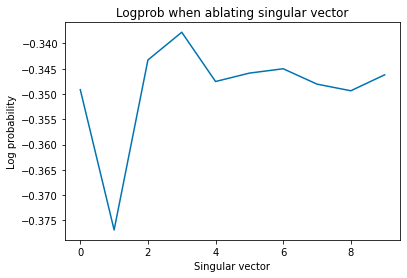

In [ ]:
text = "Be careful leaving the iron on because it might catch"
#text = "When the temperature gets below 0 water turns into"
#text = "mans best friend is a "

removing_singular_vector_comparison(text, layer_idx=22, head_idx = 3)

We see that when we ablate the fire vector the logprobability of outputting the word 'fire' to the prompt that strongly cues it decreases substantially compared to when we ablate other vectors.

Interestingly, the antipodal structure of the representations in head 3 layer 22 are on display as the logprob *increases* when we ablate singular vector 3 which is the 'ice' singular vector.

A key limitation of this method, however, appears to be that processing [seems highly distributed](https://arxiv.org/pdf/2210.07229) through the network and that removing the singular vector from one MLP or one attention head in one block, while it has a differentially large effect on that logit, is rarely sufficient to change the global behaviour of the network. We still need to develop the targeting of multiple updates with a combined effect powerful enough to achieve targeted edits that are both specific and have large enough effect sizes to robustly and reliably change model behaviour.

However, we believe that this approach offers a promising and alternative path towards being able to make highly precise edits to existing models to sculpt their behaviour in desired ways and to remove potentially harmful information or behaviours.

# Discussion

Overall, we have shown that the SVD directions of the OV and MLP-in and MLP-out weights have highly interpretable semantic directions, and that these directions can be used to selectively change model behaviour.

Returning to the more broader question over the nature of the network's representations, we believe that the success of our method shows relatively strong support for the linear features-as-directions hypothesis, at least in residual networks. We believe this makes sense because residual networks are likely to behave in substantially more linear ways than hierarchical models such as CNNs. This is because the residual stream is a fundamentally linear mode of information transfer which is read-from and written to by linear operations. The only nonlinearities in the network occur in the residual blocks and are 'shielded' from the residual stream by linear transformations (if we ignore layer norms). Moreover, the 'default' path through the residual stream is a linear map from input to output determined solely by the embedding and de-embedding matrices meaning that if information is not written to by the nonlinear blocks, then it will remain in a linear superposition. We believe that all these factors strongly suggest that a high degree of the representational structure in the residual stream is probably linear. This is good news for interpretability, as we probably have a better hope of deeply understanding linear rather than nonlinear representations.

However, while neural networks, and especially residual architectures like transformers appear to possess a great deal of linear structure, they must also utilize a significant amount of nonlinear computation -- and indeed must do so if they are to represent nonlinear functions. It is thus possible that representations are encoded in a primarily nonlinear way and our methods cannot capture these kinds of representations. Understanding the degree to which transformer representations are linear vs nonlinear, and developing methods that can help us discover, locate, and interpret nonlinear representations will ultimately be necessary for fully solving interpretability of any nonlinear neural network.

This work is also important since it begins to shed some light on the representational structure of the MLP blocks in the transformer. While some prior progress has been made on understanding the attention blocks, and specifically the attention patterns, much less progress has been made on understanding the MLP blocks. Our work is thus highly complementary to prior work in that we show that we can use our SVD directions approach to generate interpretable directions for both the MLP input and output weights, as well as the OV circuit, while our techniques have much less success when applied to the QK circuit of the attention layers. We hypothesize that this is because the processing in the QK circuit is highly syntactic as opposed to semantic. For instance, induction heads have been found in QK circuits which tend to look for tokens which follow or precede a given token and apply them elsewhere *regardless of the identity* of the previous token. Such a circuit would generate meaningless-looking SVD directions when projected to token space.

An important distinction to keep in mind is between the directions of representations in the *activities* of a network for a given input, which is the usual approach taken (i.e. in the logit lens), vs the representations of the directions of the *weights*. Investigating the weights has an interesting set of advantages and disadvantages compared to the activations.

A central difference which impacts the difficulty of the analysis is that the weights are static and known ahead of time while the activations can change and are technically unbounded, as an infinite number of inputs can be fed to the network resulting in different activations. Analyses of weights of a given network therefore is a promising type of  *static analysis* for neural networks equivalent to static analysis of source code which can just be run quickly on any given network before actually having to run it on live inputs. This could potentially be used for alignment as a first line of defense against any kind of harmful behaviour *without having to run the network at all*. Techniques that analyze the weights are also typically cheaper computationally, since they do not involve running large numbers of forward passes through the network and/or storing large amounts of activations or dealing with large datasets.

Conversely, the downsides of weight analysis is that it cannot tell us about specific model behaviours on specific tokens. The weights instead can be thought of as encoding the space of potential transformations that can be applied to a specific input datapoint but not any specific transformation. They probably can also be used to derive information about average behaviour of the network but not necessarily extreme behaviour which might be most useful for alignment. A further line of necessary and important work will be correlating the insights we can obtain from analyzing both the weights and the activations -- for instance for a given set of activations, can we trace through the primary weight directions *on those activations* and hence begin to get a much better sense of the true *program trace* of the network rather than just its static source code, which the weights provide.

Finally, while our findings of semantically interpretable SVD directions in the weights is highly robust, we believe that our applications of directly editing model weights and automated methods for finding relevant weight directions for a given query can be much improved in future work, and developing automated methods to do this will be highly important for any large scale interpretability approach. We also will try finding dataset examples that maximize the similarity with the singular vectors in the latent space, as these may give even more signal than the direct token projections.






# Appendices

## The Embedding matrix SVD directions are also fairly interpretable

As a final note, this approach does not just apply to the MLP and OV weights inside the transformer but also a fair amount of semantic information appears to be contained directly within the singular vectors of the embedding matrix itself. This means that the initial latent space provided to the first transformer blocks is already somewhat segmented into interpretable directions.

In [ ]:
print(emb.shape)
emb = emb.cpu().detach()

torch.Size([1024, 50257])


In [ ]:
U,S,V = torch.linalg.svd(emb,full_matrices=False)


In [ ]:
Vs = []
for i in range(30):
  Vs.append(V[i,:].float())
k = 30
Vs = torch.stack(Vs, dim=1).unsqueeze(1)
pysvelte.TopKTable(tokens=all_tokens, activations=Vs, obj_type="SVD direction", k=k).show()

/content/svd_directions/PySvelte/src/TopKTable.py:59: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  activations_tensor = torch.tensor(activations).to(device)
